In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx
from subprocess import check_output
%matplotlib inline

In [122]:
df=pd.read_csv('C:\\Users\\p860n111\\Desktop\\data science\\Hw2\\Shakespeare_data.csv')

In [4]:
df.describe

<bound method NDFrame.describe of         Dataline            Play  PlayerLinenumber ActSceneLine  \
0              1        Henry IV               NaN          NaN   
1              2        Henry IV               NaN          NaN   
2              3        Henry IV               NaN          NaN   
3              4        Henry IV               1.0        1.1.1   
4              5        Henry IV               1.0        1.1.2   
5              6        Henry IV               1.0        1.1.3   
6              7        Henry IV               1.0        1.1.4   
7              8        Henry IV               1.0        1.1.5   
8              9        Henry IV               1.0        1.1.6   
9             10        Henry IV               1.0        1.1.7   
10            11        Henry IV               1.0        1.1.8   
11            12        Henry IV               1.0        1.1.9   
12            13        Henry IV               1.0       1.1.10   
13            14        Henr

In [5]:
#to check the values for columns that have NaN value in them 
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111396 entries, 0 to 111395
Data columns (total 6 columns):
Dataline            111396 non-null int64
Play                111396 non-null object
PlayerLinenumber    111393 non-null float64
ActSceneLine        105153 non-null object
Player              111389 non-null object
PlayerLine          111396 non-null object
dtypes: float64(1), int64(1), object(4)
memory usage: 5.1+ MB
None


In [6]:
df.head(10)

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine
0,1,Henry IV,NaN,NaN,NaN,ACT I
1,2,Henry IV,NaN,NaN,NaN,SCENE I. London. The palace.
2,3,Henry IV,NaN,NaN,NaN,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ..."
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,"
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,"
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil
8,9,Henry IV,1.0,1.1.6,KING HENRY IV,Shall daub her lips with her own children's bl...
9,10,Henry IV,1.0,1.1.7,KING HENRY IV,"Nor more shall trenching war channel her fields,"


In [7]:
df.describe()

,Dataline,PlayerLinenumber
count,111396.000000,111393.000000
mean,55698.500000,36.885334
std,32157.399631,39.985840
min,1.000000,1.000000
25%,27849.750000,10.000000
50%,55698.500000,25.000000
75%,83547.250000,50.000000
max,111396.000000,405.000000


In [8]:
# to see the total number of columns in the dataset.
df.columns

Index(['Dataline', 'Play', 'PlayerLinenumber', 'ActSceneLine', 'Player',
       'PlayerLine'],
      dtype='object')

In [9]:
#to find the total number of unique play
print("Number of plays are: " + str(df['Play'].nunique()))

Number of plays are: 36


In [123]:
# to replace the NaN value in the Player column to be Unknown
df['Player'].replace(np.nan, 'Unknown',inplace = True)

In [10]:
# to check that the Player column has all i.e. 111396 non null values.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111396 entries, 0 to 111395
Data columns (total 6 columns):
Dataline            111396 non-null int64
Play                111396 non-null object
PlayerLinenumber    111393 non-null float64
ActSceneLine        105153 non-null object
Player              111396 non-null object
PlayerLine          111396 non-null object
dtypes: float64(1), int64(1), object(4)
memory usage: 5.1+ MB


In [12]:
# to verify that the missing values in Palyer column got replaced by Unknown
df.head()

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine
0,1,Henry IV,NaN,NaN,Unknown,ACT I
1,2,Henry IV,NaN,NaN,Unknown,SCENE I. London. The palace.
2,3,Henry IV,NaN,NaN,Unknown,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ..."
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,"
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,"


In [13]:
# to print the count of unique plays and their names
print("The total number of plays are: " + str(df['Play'].nunique())+" and their names are as follows: " + str(df['Play'].unique()))

The total number of plays are: 36 and their names are as follows: ['Henry IV' 'Henry VI Part 1' 'Henry VI Part 2' 'Henry VI Part 3'
 'Alls well that ends well' 'As you like it' 'Antony and Cleopatra'
 'A Comedy of Errors' 'Coriolanus' 'Cymbeline' 'Hamlet' 'Henry V'
 'Henry VIII' 'King John' 'Julius Caesar' 'King Lear' 'Loves Labours Lost'
 'macbeth' 'Measure for measure' 'Merchant of Venice'
 'Merry Wives of Windsor' 'A Midsummer nights dream'
 'Much Ado about nothing' 'Othello' 'Pericles' 'Richard II' 'Richard III'
 'Romeo and Juliet' 'Taming of the Shrew' 'The Tempest' 'Timon of Athens'
 'Titus Andronicus' 'Troilus and Cressida' 'Twelfth Night'
 'Two Gentlemen of Verona' 'A Winters Tale']


In [14]:
#creating a new data frame that will contain unique Plays value as a new column named: Name of the Play

pd.DataFrame(df['Play'].unique().tolist(), columns=['Name of the Play'])

,Name of the Play
0,Henry IV
1,Henry VI Part 1
2,Henry VI Part 2
3,Henry VI Part 3
4,Alls well that ends well
5,As you like it
6,Antony and Cleopatra
7,A Comedy of Errors
8,Coriolanus
9,Cymbeline


In [15]:
# Additional Information 1: For each Play, number of lines (PlayerLine) spoken by each PlaYer

df.groupby(['Play','Player']).count()['PlayerLine']


Play                      Player            
A Comedy of Errors        ADRIANA               284
                          AEGEON                150
                          AEMELIA                75
                          ANGELO                 99
                          ANTIPHOLUS              6
                          BALTHAZAR              31
                          Courtezan              43
                          DROMIO OF EPHESUS     191
                          DROMIO OF SYRACUSE    323
                          DUKE SOLINUS           97
                          First Merchant         19
                          Gaoler                  1
                          LUCE                   11
                          LUCIANA               118
                          OCTAVIUS CAESAR         3
                          OF EPHESUS            221
                          OF SYRACUSE           292
                          Officer                17
                   

In [16]:
# Now converting the above data into a frame (playWise_lines_per_player).

playWise_lines_per_player= df.groupby(['Play','Player']).count()['PlayerLine']
playWise_lines_per_player= playWise_lines_per_player.to_frame()
playWise_lines_per_player

PlayerLine
Play                     Player                        
A Comedy of Errors       ADRIANA                    284
                         AEGEON                     150
                         AEMELIA                     75
                         ANGELO                      99
                         ANTIPHOLUS                   6
                         BALTHAZAR                   31
                         Courtezan                   43
                         DROMIO OF EPHESUS          191
                         DROMIO OF SYRACUSE         323
                         DUKE SOLINUS                97
                         First Merchant              19
                         Gaoler                       1
                         LUCE                        11
                         LUCIANA                    118
                         OCTAVIUS CAESAR              3
                         OF EPHESUS                 221
                         OF SYRACUSE                292
                         Officer                     17
                         PINCH                       17
                         Second Merchant             41
                         Servant                     16
A Midsummer nights dream ALL                          2
                         BOTTOM                     220
                         COBWEB                       4
                         DEMETRIUS                  144
                         EGEUS                       42
                         FLUTE                       26
                         FORD                         3
                         Fairy                       33
                         HELENA                     237
...                                                 ...
macbeth                  First Murderer              35
                         First Witch                 68
                         Gentlewoman                 27
                         HECATE                      43
                         LADY MACBETH               279
                         LADY MACDUFF                43
                         LENNOX                      79
                         Lord                        25
                         Lords                        4
                         MACBETH                    783
                         MACDUFF                    193
                         MALCOLM                    222
                         MENTEITH                    12
                         Messenger                   24
                         Old Man                     15
                         Porter                      53
                         ROSS                       137
                         SEYTON                       6
                         SIWARD                      37
                         Second Apparition            5
                         Second Murderer             16
                         Second Witch                29
                         Sergeant                    35
                         Servant                      6
                         Soldiers                     1
                         Son                         24
                         Third Apparition             6
                         Third Murderer               8
                         Third Witch                 27
                         YOUNG SIWARD                 8

[1328 rows x 1 columns]

In [17]:
playWise_lines_per_player.describe()

,PlayerLine
count,1328.000000
mean,83.882530
std,149.184171
min,1.000000
25%,6.000000
50%,23.000000
75%,86.500000
max,1582.000000


In [18]:
# Additional Information 2: To count the number of PlayerLine corresponding to each Play.

df.groupby('Play').count().sort_values(by='PlayerLine',ascending=True)['PlayerLine']

Play
A Comedy of Errors          2055
A Midsummer nights dream    2300
Two Gentlemen of Verona     2357
The Tempest                 2403
macbeth                     2586
Pericles                    2641
Twelfth Night               2648
Timon of Athens             2662
Much Ado about nothing      2704
Titus Andronicus            2726
King John                   2766
Julius Caesar               2771
Merchant of Venice          2802
Taming of the Shrew         2806
As you like it              2822
Merry Wives of Windsor      2831
Richard II                  2937
Henry VI Part 1             2983
Loves Labours Lost          2986
Measure for measure         2998
Alls well that ends well    3083
Henry VI Part 3             3138
Henry IV                    3205
Romeo and Juliet            3313
Henry VI Part 2             3334
Henry V                     3395
Henry VIII                  3419
A Winters Tale              3489
Troilus and Cressida        3711
Othello                     3762
King 

In [19]:
#Converting the data into a dataframe (playerLinePerPlay)
playerLinePerPlay = df.groupby('Play').count().sort_values(by='PlayerLine',ascending=True)['PlayerLine']

In [20]:
playerLinePerPlay

Play
A Comedy of Errors          2055
A Midsummer nights dream    2300
Two Gentlemen of Verona     2357
The Tempest                 2403
macbeth                     2586
Pericles                    2641
Twelfth Night               2648
Timon of Athens             2662
Much Ado about nothing      2704
Titus Andronicus            2726
King John                   2766
Julius Caesar               2771
Merchant of Venice          2802
Taming of the Shrew         2806
As you like it              2822
Merry Wives of Windsor      2831
Richard II                  2937
Henry VI Part 1             2983
Loves Labours Lost          2986
Measure for measure         2998
Alls well that ends well    3083
Henry VI Part 3             3138
Henry IV                    3205
Romeo and Juliet            3313
Henry VI Part 2             3334
Henry V                     3395
Henry VIII                  3419
A Winters Tale              3489
Troilus and Cressida        3711
Othello                     3762
King 

In [21]:
playerLinePerPlay = playerLinePerPlay.to_frame()

In [22]:
playerLinePerPlay

,PlayerLine
Play,
A Comedy of Errors,2055
A Midsummer nights dream,2300
Two Gentlemen of Verona,2357
The Tempest,2403
macbeth,2586
Pericles,2641
Twelfth Night,2648
Timon of Athens,2662
Much Ado about nothing,2704


In [23]:
# applying indexing to the above dataframe
playerLinePerPlay['Play'] = playerLinePerPlay.index.tolist()

In [24]:
playerLinePerPlay

,PlayerLine,Play
Play,,
A Comedy of Errors,2055,A Comedy of Errors
A Midsummer nights dream,2300,A Midsummer nights dream
Two Gentlemen of Verona,2357,Two Gentlemen of Verona
The Tempest,2403,The Tempest
macbeth,2586,macbeth
Pericles,2641,Pericles
Twelfth Night,2648,Twelfth Night
Timon of Athens,2662,Timon of Athens
Much Ado about nothing,2704,Much Ado about nothing


In [25]:
playerLinePerPlay.index = np.arange(0,len(playerLinePerPlay))

In [26]:
playerLinePerPlay

,PlayerLine,Play
0,2055,A Comedy of Errors
1,2300,A Midsummer nights dream
2,2357,Two Gentlemen of Verona
3,2403,The Tempest
4,2586,macbeth
5,2641,Pericles
6,2648,Twelfth Night
7,2662,Timon of Athens
8,2704,Much Ado about nothing
9,2726,Titus Andronicus


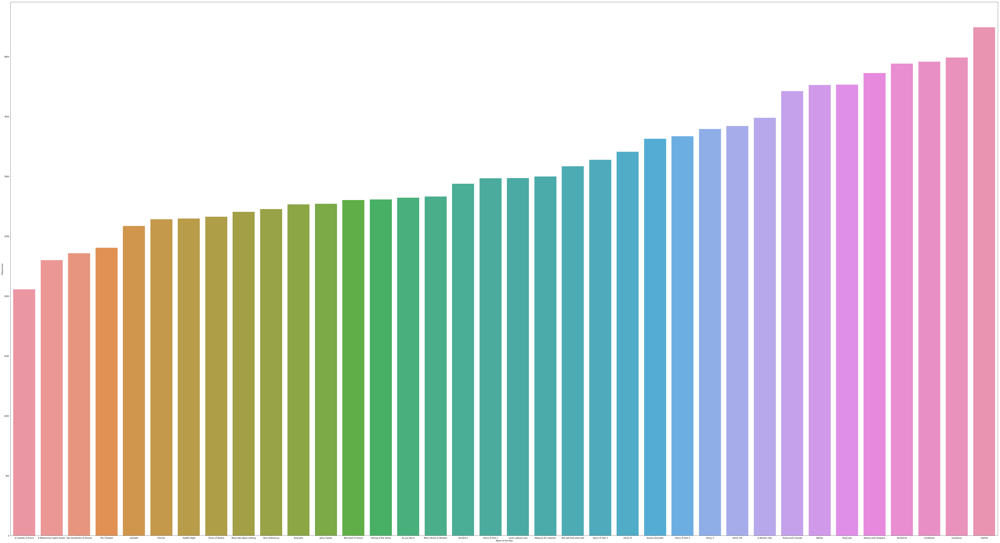

In [27]:
# plotting a graph to show: PlayerLine against Name of the Play
plt.figure(figsize=(90,50))
ax= sns.barplot(x='Play',y='PlayerLine',data=playerLinePerPlay, order = playerLinePerPlay['Play'])
ax.set(xlabel='Name of the Play', ylabel='PlayerLines')
plt.show()

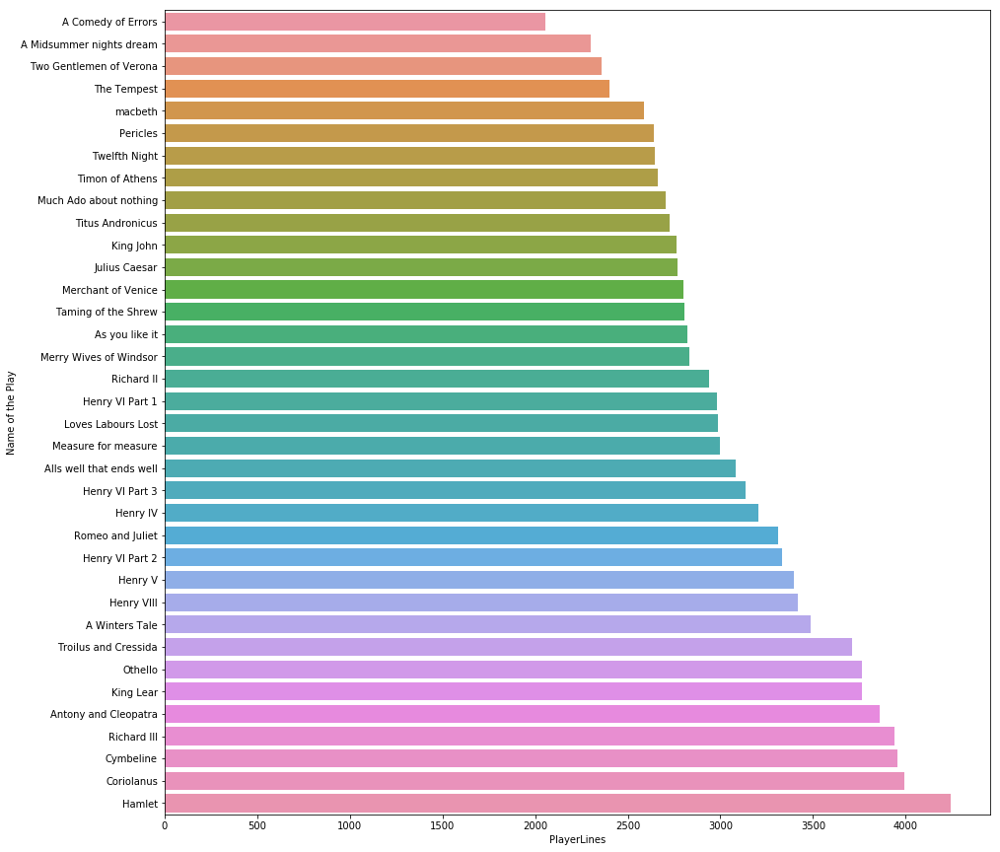

In [28]:
plt.figure(figsize=(15,15))
ax= sns.barplot(x='PlayerLine',y='Play',data=playerLinePerPlay, order = playerLinePerPlay['Play'])
ax.set(xlabel='PlayerLines', ylabel='Name of the Play')
plt.show()

In [30]:
# Additional Information 3: Number of Players corresponding to each Play

playersPerPlay = df.groupby(['Play'])['Player'].nunique().sort_values(ascending= True)

In [31]:
playersPerPlay

Play
Two Gentlemen of Verona     18
Twelfth Night               19
The Tempest                 20
A Comedy of Errors          21
Loves Labours Lost          21
Much Ado about nothing      24
Merchant of Venice          24
Merry Wives of Windsor      25
Alls well that ends well    26
Measure for measure         26
King Lear                   27
Titus Andronicus            28
As you like it              28
Othello                     29
Troilus and Cressida        29
King John                   29
A Midsummer nights dream    31
Hamlet                      35
A Winters Tale              36
Henry IV                    36
Romeo and Juliet            37
Richard II                  37
Taming of the Shrew         38
macbeth                     42
Cymbeline                   42
Henry VI Part 3             46
Henry VIII                  47
Henry V                     47
Pericles                    48
Julius Caesar               51
Henry VI Part 1             53
Antony and Cleopatra        55
Tim

In [32]:
#changing to it to dataframe
playersPerPlay=playersPerPlay.to_frame()

In [33]:
playersPerPlay

,Player
Play,
Two Gentlemen of Verona,18
Twelfth Night,19
The Tempest,20
A Comedy of Errors,21
Loves Labours Lost,21
Much Ado about nothing,24
Merchant of Venice,24
Merry Wives of Windsor,25
Alls well that ends well,26


In [34]:
playersPerPlay['Play'] = playersPerPlay.index.tolist()

In [35]:
playersPerPlay

,Player,Play
Play,,
Two Gentlemen of Verona,18,Two Gentlemen of Verona
Twelfth Night,19,Twelfth Night
The Tempest,20,The Tempest
A Comedy of Errors,21,A Comedy of Errors
Loves Labours Lost,21,Loves Labours Lost
Much Ado about nothing,24,Much Ado about nothing
Merchant of Venice,24,Merchant of Venice
Merry Wives of Windsor,25,Merry Wives of Windsor
Alls well that ends well,26,Alls well that ends well


In [36]:
# now to change the index from Play to 0 - (length-1) adn renaming the column name 

playersPerPlay.columns = ['Number of Players','Name of the Play']

In [37]:
playersPerPlay

,Number of Players,Name of the Play
Play,,
Two Gentlemen of Verona,18,Two Gentlemen of Verona
Twelfth Night,19,Twelfth Night
The Tempest,20,The Tempest
A Comedy of Errors,21,A Comedy of Errors
Loves Labours Lost,21,Loves Labours Lost
Much Ado about nothing,24,Much Ado about nothing
Merchant of Venice,24,Merchant of Venice
Merry Wives of Windsor,25,Merry Wives of Windsor
Alls well that ends well,26,Alls well that ends well


In [38]:
playersPerPlay.index= np.arange(0,len(playersPerPlay))
playersPerPlay

,Number of Players,Name of the Play
0,18,Two Gentlemen of Verona
1,19,Twelfth Night
2,20,The Tempest
3,21,A Comedy of Errors
4,21,Loves Labours Lost
5,24,Much Ado about nothing
6,24,Merchant of Venice
7,25,Merry Wives of Windsor
8,26,Alls well that ends well
9,26,Measure for measure


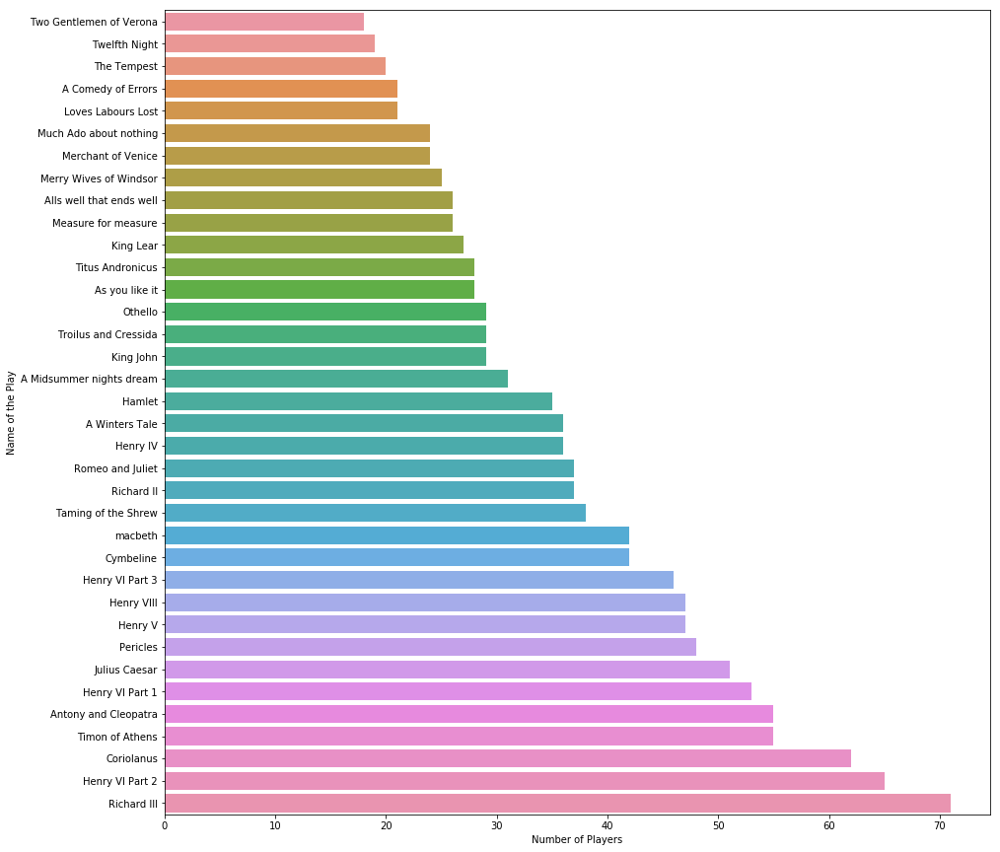

In [39]:
# plotting graph

plt.figure(figsize=(15,15))
ax = sns.barplot(x='Number of Players',y='Name of the Play',data=playersPerPlay)
ax.set(xlabel='Number of Players', ylabel='Name of the Play')
plt.show()

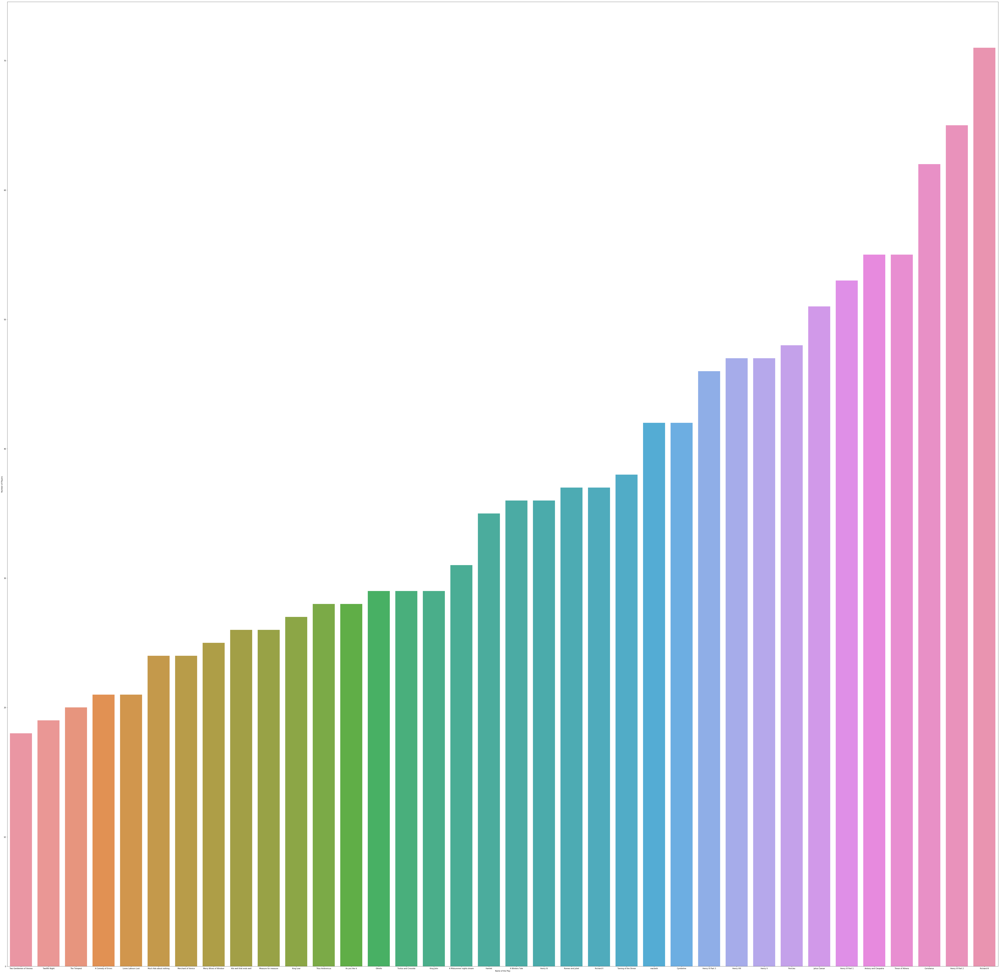

In [40]:
plt.figure(figsize=(100,100))
ax = sns.barplot(x='Name of the Play',y='Number of Players',data=playersPerPlay)
ax.set(xlabel='Name of the Play', ylabel='Number of Players')
plt.show()

In [42]:
# to calculate the total words in each PlayerLine cell entry
df['new_column'] = df.PlayerLine.apply(lambda x: len(str(x).split(' ')))

In [43]:
df

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,new_column
0,1,Henry IV,NaN,NaN,Unknown,ACT I,2
1,2,Henry IV,NaN,NaN,Unknown,SCENE I. London. The palace.,5
2,3,Henry IV,NaN,NaN,Unknown,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ...",16
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,7
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,7
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,8
8,9,Henry IV,1.0,1.1.6,KING HENRY IV,Shall daub her lips with her own children's bl...,9
9,10,Henry IV,1.0,1.1.7,KING HENRY IV,"Nor more shall trenching war channel her fields,",8


In [44]:
df.groupby(['Player'])['new_column']

In [45]:
df

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,new_column
0,1,Henry IV,NaN,NaN,Unknown,ACT I,2
1,2,Henry IV,NaN,NaN,Unknown,SCENE I. London. The palace.,5
2,3,Henry IV,NaN,NaN,Unknown,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ...",16
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,7
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,7
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,8
8,9,Henry IV,1.0,1.1.6,KING HENRY IV,Shall daub her lips with her own children's bl...,9
9,10,Henry IV,1.0,1.1.7,KING HENRY IV,"Nor more shall trenching war channel her fields,",8


In [46]:
df

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,new_column
0,1,Henry IV,NaN,NaN,Unknown,ACT I,2
1,2,Henry IV,NaN,NaN,Unknown,SCENE I. London. The palace.,5
2,3,Henry IV,NaN,NaN,Unknown,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ...",16
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,7
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,7
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,8
8,9,Henry IV,1.0,1.1.6,KING HENRY IV,Shall daub her lips with her own children's bl...,9
9,10,Henry IV,1.0,1.1.7,KING HENRY IV,"Nor more shall trenching war channel her fields,",8


In [50]:

df.rename(columns={'new_column': 'NoOfWordsInPlayerLine'}, inplace=True)

In [51]:
df

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,NoOfWordsInPlayerLine
0,1,Henry IV,NaN,NaN,Unknown,ACT I,2
1,2,Henry IV,NaN,NaN,Unknown,SCENE I. London. The palace.,5
2,3,Henry IV,NaN,NaN,Unknown,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ...",16
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,7
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,7
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,8
8,9,Henry IV,1.0,1.1.6,KING HENRY IV,Shall daub her lips with her own children's bl...,9
9,10,Henry IV,1.0,1.1.7,KING HENRY IV,"Nor more shall trenching war channel her fields,",8


In [52]:
h=df.groupby('Player')

In [53]:
for Player, data in h:
    print("Player:",Player)
    print("\n")
    print("Player:",data)

Player: A Lord


Player:        Dataline            Play  PlayerLinenumber ActSceneLine  Player  \
17876     17877  As you like it               2.0        4.2.2  A Lord   

           PlayerLine  NoOfWordsInPlayerLine  
17876  Sir, it was I.                      4  
Player: A Patrician


Player:        Dataline        Play  PlayerLinenumber ActSceneLine       Player  \
26517     26518  Coriolanus             117.0      3.1.319  A Patrician   
26633     26634  Coriolanus               2.0        3.2.7  A Patrician   
26656     26657  Coriolanus               8.0       3.2.29  A Patrician   
26657     26658  Coriolanus               8.0          NaN  A Patrician   

                             PlayerLine  NoOfWordsInPlayerLine  
26517  This man has marr'd his fortune.                      6  
26633                You do the nobler.                      4  
26656                 Ay, and burn too.                      4  
26657       Enter MENENIUS and Senators                      4  
P

[65 rows x 7 columns]
Player: AJAX


Player:         Dataline                  Play  PlayerLinenumber ActSceneLine Player  \
100054    100055  Troilus and Cressida               1.0        2.1.1   AJAX   
100057    100058  Troilus and Cressida               3.0        2.1.4   AJAX   
100060    100061  Troilus and Cressida               5.0        2.1.7   AJAX   
100062    100063  Troilus and Cressida               7.0        2.1.9   AJAX   
100063    100064  Troilus and Cressida               7.0          NaN   AJAX   
100064    100065  Troilus and Cressida               7.0       2.1.10   AJAX   
100067    100068  Troilus and Cressida               9.0       2.1.13   AJAX   
100068    100069  Troilus and Cressida               9.0       2.1.14   AJAX   
100073    100074  Troilus and Cressida              11.0       2.1.19   AJAX   
100075    100076  Troilus and Cressida              13.0       2.1.21   AJAX   
100077    100078  Troilus and Cressida              15.0       2.1.23   AJA

[68 rows x 7 columns]
Player: ARTEMIDORUS


Player:        Dataline           Play  PlayerLinenumber ActSceneLine       Player  \
47377     47378  Julius Caesar               1.0        2.3.1  ARTEMIDORUS   
47378     47379  Julius Caesar               1.0        2.3.2  ARTEMIDORUS   
47379     47380  Julius Caesar               1.0        2.3.3  ARTEMIDORUS   
47380     47381  Julius Caesar               1.0        2.3.4  ARTEMIDORUS   
47381     47382  Julius Caesar               1.0        2.3.5  ARTEMIDORUS   
47382     47383  Julius Caesar               1.0        2.3.6  ARTEMIDORUS   
47383     47384  Julius Caesar               1.0        2.3.7  ARTEMIDORUS   
47384     47385  Julius Caesar               1.0        2.3.8  ARTEMIDORUS   
47385     47386  Julius Caesar               1.0        2.3.9  ARTEMIDORUS   
47386     47387  Julius Caesar               1.0       2.3.10  ARTEMIDORUS   
47387     47388  Julius Caesar               1.0       2.3.11  ARTEMIDORUS   
47388     47

5106               Confirm it so, mine honourable lord.                      6  
Player: BASSIANUS


Player:        Dataline              Play  PlayerLinenumber ActSceneLine     Player  \
96476     96477  Titus Andronicus               2.0        1.1.9  BASSIANUS   
96477     96478  Titus Andronicus               2.0       1.1.10  BASSIANUS   
96478     96479  Titus Andronicus               2.0       1.1.11  BASSIANUS   
96479     96480  Titus Andronicus               2.0       1.1.12  BASSIANUS   
96480     96481  Titus Andronicus               2.0       1.1.13  BASSIANUS   
96481     96482  Titus Andronicus               2.0       1.1.14  BASSIANUS   
96482     96483  Titus Andronicus               2.0       1.1.15  BASSIANUS   
96483     96484  Titus Andronicus               2.0       1.1.16  BASSIANUS   
96484     96485  Titus Andronicus               2.0       1.1.17  BASSIANUS   
96485     96486  Titus Andronicus               2.0          NaN  BASSIANUS   
96515     96516  Titus

Player:        Dataline                      Play  PlayerLinenumber ActSceneLine  \
67264     67265  A Midsummer nights dream               2.0        1.2.2   
67265     67266  A Midsummer nights dream               2.0        1.2.3   
67270     67271  A Midsummer nights dream               4.0        1.2.8   
67271     67272  A Midsummer nights dream               4.0        1.2.9   
67272     67273  A Midsummer nights dream               4.0       1.2.10   
67275     67276  A Midsummer nights dream               6.0       1.2.13   
67276     67277  A Midsummer nights dream               6.0       1.2.14   
67277     67278  A Midsummer nights dream               6.0       1.2.15   
67279     67280  A Midsummer nights dream               8.0       1.2.17   
67281     67282  A Midsummer nights dream              10.0       1.2.19   
67283     67284  A Midsummer nights dream              12.0       1.2.21   
67284     67285  A Midsummer nights dream              12.0       1.2.22   
6728

Player:         Dataline            Play  PlayerLinenumber ActSceneLine   Player  \
107914    107915  A Winters Tale               2.0        1.1.5  CAMILLO   
107915    107916  A Winters Tale               2.0        1.1.6  CAMILLO   
107918    107919  A Winters Tale               4.0        1.1.9  CAMILLO   
107925    107926  A Winters Tale               6.0       1.1.16  CAMILLO   
107928    107929  A Winters Tale               8.0       1.1.19  CAMILLO   
107929    107930  A Winters Tale               8.0       1.1.20  CAMILLO   
107930    107931  A Winters Tale               8.0       1.1.21  CAMILLO   
107931    107932  A Winters Tale               8.0       1.1.22  CAMILLO   
107932    107933  A Winters Tale               8.0       1.1.23  CAMILLO   
107933    107934  A Winters Tale               8.0       1.1.24  CAMILLO   
107934    107935  A Winters Tale               8.0       1.1.25  CAMILLO   
107935    107936  A Winters Tale               8.0       1.1.26  CAMILLO   
1079

Player: CLAUDIUS


Player:        Dataline           Play  PlayerLinenumber ActSceneLine    Player  \
48590     48591  Julius Caesar             143.0      4.3.338  CLAUDIUS   
48592     48593  Julius Caesar             146.0      4.3.340  CLAUDIUS   
48595     48596  Julius Caesar             149.0      4.3.343  CLAUDIUS   
48599     48600  Julius Caesar             152.0      4.3.347  CLAUDIUS   
48600     48601  Julius Caesar             152.0          NaN  CLAUDIUS   
48601     48602  Julius Caesar             152.0          NaN  CLAUDIUS   
48602     48603  Julius Caesar             152.0          NaN  CLAUDIUS   
48603     48604  Julius Caesar             152.0          NaN  CLAUDIUS   

                                   PlayerLine  NoOfWordsInPlayerLine  
48590                                My lord?                      2  
48592                        Did we, my lord?                      4  
48595                         Nor I, my lord.                      4  
48599        

90463                      2  
Player: CYMBELINE


Player:        Dataline       Play  PlayerLinenumber ActSceneLine     Player  \
28632     28633  Cymbeline              31.0      1.1.147  CYMBELINE   
28633     28634  Cymbeline              31.0      1.1.148  CYMBELINE   
28634     28635  Cymbeline              31.0      1.1.149  CYMBELINE   
28635     28636  Cymbeline              31.0      1.1.150  CYMBELINE   
28641     28642  Cymbeline              34.0      1.1.155  CYMBELINE   
28642     28643  Cymbeline              34.0      1.1.156  CYMBELINE   
28643     28644  Cymbeline              34.0      1.1.157  CYMBELINE   
28648     28649  Cymbeline              36.0      1.1.162  CYMBELINE   
28650     28651  Cymbeline              38.0      1.1.164  CYMBELINE   
28653     28654  Cymbeline              40.0      1.1.167  CYMBELINE   
28654     28655  Cymbeline              40.0      1.1.168  CYMBELINE   
28657     28658  Cymbeline              42.0      1.1.171  CYMBELINE   
28663

[116 rows x 7 columns]
Player: DON PEDRO


Player:        Dataline                    Play  PlayerLinenumber ActSceneLine  \
69382     69383  Much Ado about nothing              38.0       1.1.83   
69383     69384  Much Ado about nothing              38.0       1.1.84   
69384     69385  Much Ado about nothing              38.0       1.1.85   
69389     69390  Much Ado about nothing              40.0       1.1.90   
69390     69391  Much Ado about nothing              40.0       1.1.91   
69394     69395  Much Ado about nothing              44.0       1.1.95   
69395     69396  Much Ado about nothing              44.0       1.1.96   
69396     69397  Much Ado about nothing              44.0       1.1.97   
69397     69398  Much Ado about nothing              44.0       1.1.98   
69428     69429  Much Ado about nothing              57.0      1.1.129   
69429     69430  Much Ado about nothing              57.0      1.1.130   
69430     69431  Much Ado about nothing              57.0    

[97 rows x 7 columns]
Player: DUKE VINCENTIO


Player:        Dataline                 Play  PlayerLinenumber ActSceneLine  \
58368     58369  Measure for measure               1.0        1.1.1   
58370     58371  Measure for measure               3.0        1.1.3   
58371     58372  Measure for measure               3.0        1.1.4   
58372     58373  Measure for measure               3.0        1.1.5   
58373     58374  Measure for measure               3.0        1.1.6   
58374     58375  Measure for measure               3.0        1.1.7   
58375     58376  Measure for measure               3.0        1.1.8   
58376     58377  Measure for measure               3.0        1.1.9   
58377     58378  Measure for measure               3.0       1.1.10   
58378     58379  Measure for measure               3.0       1.1.11   
58379     58380  Measure for measure               3.0       1.1.12   
58380     58381  Measure for measure               3.0       1.1.13   
58381     58382  Measu

81323                     10  
Player: Egyptian


Player:        Dataline                  Play  PlayerLinenumber ActSceneLine  \
21922     21923  Antony and Cleopatra              15.0       5.1.61   
21923     21924  Antony and Cleopatra              15.0       5.1.62   
21924     21925  Antony and Cleopatra              15.0       5.1.63   
21925     21926  Antony and Cleopatra              15.0       5.1.64   
21926     21927  Antony and Cleopatra              15.0       5.1.65   
21932     21933  Antony and Cleopatra              17.0       5.1.71   
21933     21934  Antony and Cleopatra              17.0          NaN   

         Player                                   PlayerLine  \
21922  Egyptian  A poor Egyptian yet. The queen my mistress,   
21923  Egyptian       Confined in all she has, her monument,   
21924  Egyptian          Of thy intents desires instruction,   
21925  Egyptian        That she preparedly may frame herself   
21926  Egyptian                  To the way s

[99 rows x 7 columns]
Player: First Commoner


Player:        Dataline           Play  PlayerLinenumber ActSceneLine          Player  \
46264     46265  Julius Caesar               2.0        1.1.6  First Commoner   

                   PlayerLine  NoOfWordsInPlayerLine  
46264  Why, sir, a carpenter.                      4  
Player: First Conspirator


Player:        Dataline        Play  PlayerLinenumber ActSceneLine             Player  \
28297     28298  Coriolanus               2.0       5.6.10  First Conspirator   
28334     28335  Coriolanus              10.0       5.6.47  First Conspirator   
28335     28336  Coriolanus              10.0       5.6.48  First Conspirator   
28336     28337  Coriolanus              10.0       5.6.49  First Conspirator   
28337     28338  Coriolanus              10.0       5.6.50  First Conspirator   
28345     28346  Coriolanus              12.0       5.6.57  First Conspirator   
28346     28347  Coriolanus              12.0       5.6.58  First Con

Player:        Dataline        Play  PlayerLinenumber ActSceneLine            Player  \
27217     27218  Coriolanus               1.0        4.5.1  First Servingman   
27218     27219  Coriolanus               1.0        4.5.2  First Servingman   
27219     27220  Coriolanus               1.0          NaN  First Servingman   
27220     27221  Coriolanus               1.0          NaN  First Servingman   
27228     27229  Coriolanus               4.0        4.5.7  First Servingman   
27229     27230  Coriolanus               4.0        4.5.8  First Servingman   
27230     27231  Coriolanus               4.0          NaN  First Servingman   
27243     27244  Coriolanus              12.0       4.5.19  First Servingman   
27244     27245  Coriolanus              12.0       4.5.20  First Servingman   
27245     27246  Coriolanus              12.0          NaN  First Servingman   
27384     27385  Coriolanus              46.0      4.5.152  First Servingman   
27388     27389  Coriolanus     

Player: GURNEY


Player:        Dataline       Play  PlayerLinenumber ActSceneLine  Player  \
43729     43730  King John              53.0      1.1.232  GURNEY   

                     PlayerLine  NoOfWordsInPlayerLine  
43729  Good leave, good Philip.                      4  
Player: Gaoler


Player:         Dataline                Play  PlayerLinenumber ActSceneLine  Player  \
22585      22586  A Comedy of Errors              11.0      1.1.156  Gaoler   
108756    108757      A Winters Tale               2.0        2.2.8  Gaoler   
108757    108758      A Winters Tale               2.0        2.2.9  Gaoler   
108760    108761      A Winters Tale               4.0       2.2.12  Gaoler   
108761    108762      A Winters Tale               4.0       2.2.13  Gaoler   
108767    108768      A Winters Tale               6.0       2.2.19  Gaoler   
108768    108769      A Winters Tale               6.0       2.2.20  Gaoler   
108769    108770      A Winters Tale               6.0       2.2.

Player:        Dataline                Play  PlayerLinenumber ActSceneLine  \
54018     54019  Loves Labours Lost               2.0        4.2.3   
54019     54020  Loves Labours Lost               2.0        4.2.4   
54020     54021  Loves Labours Lost               2.0        4.2.5   
54021     54022  Loves Labours Lost               2.0        4.2.6   
54022     54023  Loves Labours Lost               2.0        4.2.7   
54026     54027  Loves Labours Lost               4.0       4.2.11   
54028     54029  Loves Labours Lost               6.0       4.2.13   
54029     54030  Loves Labours Lost               6.0       4.2.14   
54030     54031  Loves Labours Lost               6.0       4.2.15   
54031     54032  Loves Labours Lost               6.0       4.2.16   
54032     54033  Loves Labours Lost               6.0       4.2.17   
54033     54034  Loves Labours Lost               6.0       4.2.18   
54034     54035  Loves Labours Lost               6.0       4.2.19   
54035     54

Player: IRIS


Player:        Dataline         Play  PlayerLinenumber ActSceneLine Player  \
93166     93167  The Tempest              16.0       4.1.67   IRIS   
93167     93168  The Tempest              16.0       4.1.68   IRIS   
93168     93169  The Tempest              16.0       4.1.69   IRIS   
93169     93170  The Tempest              16.0       4.1.70   IRIS   
93170     93171  The Tempest              16.0       4.1.71   IRIS   
93171     93172  The Tempest              16.0       4.1.72   IRIS   
93172     93173  The Tempest              16.0       4.1.73   IRIS   
93173     93174  The Tempest              16.0       4.1.74   IRIS   
93174     93175  The Tempest              16.0       4.1.75   IRIS   
93175     93176  The Tempest              16.0       4.1.76   IRIS   
93176     93177  The Tempest              16.0       4.1.77   IRIS   
93177     93178  The Tempest              16.0       4.1.78   IRIS   
93178     93179  The Tempest              16.0       4.1.79   IRIS 

87837                      4  
Player: LADY ANNE


Player:        Dataline         Play  PlayerLinenumber ActSceneLine     Player  \
81515     81516  Richard III               1.0        1.2.1  LADY ANNE   
81516     81517  Richard III               1.0        1.2.2  LADY ANNE   
81517     81518  Richard III               1.0        1.2.3  LADY ANNE   
81518     81519  Richard III               1.0        1.2.4  LADY ANNE   
81519     81520  Richard III               1.0        1.2.5  LADY ANNE   
81520     81521  Richard III               1.0        1.2.6  LADY ANNE   
81521     81522  Richard III               1.0        1.2.7  LADY ANNE   
81522     81523  Richard III               1.0        1.2.8  LADY ANNE   
81523     81524  Richard III               1.0        1.2.9  LADY ANNE   
81524     81525  Richard III               1.0       1.2.10  LADY ANNE   
81525     81526  Richard III               1.0       1.2.11  LADY ANNE   
81526     81527  Richard III               1.0       

[205 rows x 7 columns]
Player: LUCETTA


Player:         Dataline                     Play  PlayerLinenumber ActSceneLine  \
105705    105706  Two Gentlemen of Verona               2.0        1.2.3   
105709    105710  Two Gentlemen of Verona               4.0        1.2.7   
105710    105711  Two Gentlemen of Verona               4.0        1.2.8   
105712    105713  Two Gentlemen of Verona               6.0       1.2.10   
105713    105714  Two Gentlemen of Verona               6.0       1.2.11   
105715    105716  Two Gentlemen of Verona               8.0       1.2.13   
105717    105718  Two Gentlemen of Verona              10.0       1.2.15   
105719    105720  Two Gentlemen of Verona              12.0       1.2.17   
105720    105721  Two Gentlemen of Verona              12.0       1.2.18   
105721    105722  Two Gentlemen of Verona              12.0       1.2.19   
105723    105724  Two Gentlemen of Verona              14.0       1.2.21   
105725    105726  Two Gentlemen of Vero

Player:        Dataline              Play  PlayerLinenumber ActSceneLine   Player  \
96854     96855  Titus Andronicus              74.0      1.1.363  MARTIUS   
96865     96866  Titus Andronicus              80.0      1.1.374  MARTIUS   
97392     97393  Titus Andronicus              44.0      2.3.197  MARTIUS   
97393     97394  Titus Andronicus              44.0      2.3.198  MARTIUS   
97394     97395  Titus Andronicus              44.0          NaN  MARTIUS   
97401     97402  Titus Andronicus              46.0      2.3.205  MARTIUS   
97402     97403  Titus Andronicus              46.0      2.3.206  MARTIUS   
97407     97408  Titus Andronicus              48.0      2.3.210  MARTIUS   
97408     97409  Titus Andronicus              48.0      2.3.211  MARTIUS   
97412     97413  Titus Andronicus              50.0      2.3.215  MARTIUS   
97413     97414  Titus Andronicus              50.0      2.3.216  MARTIUS   
97414     97415  Titus Andronicus              50.0      2.3.217  MA

Player: Musician


Player:        Dataline              Play  PlayerLinenumber ActSceneLine    Player  \
88092     88093  Romeo and Juliet              41.0      4.5.130  Musician   

                                           PlayerLine  NoOfWordsInPlayerLine  
88092  Marry, sir, because silver hath a sweet sound.                      8  
Player: NATHANIEL


Player:        Dataline                 Play  PlayerLinenumber ActSceneLine  \
90369     90370  Taming of the Shrew              40.0       4.1.95   
90373     90374  Taming of the Shrew              44.0       4.1.99   
90377     90378  Taming of the Shrew              46.0      4.1.103   
90453     90454  Taming of the Shrew              62.0      4.1.168   

          Player                                    PlayerLine  \
90369  NATHANIEL                         Welcome home, Grumio!   
90373  NATHANIEL                             How now, old lad?   
90377  NATHANIEL  All things is ready. How near is our master?   
90453  NAT

Player:        Dataline        Play  PlayerLinenumber ActSceneLine    Player  \
41268     41269  Henry VIII               2.0       2.3.12  Old Lady   
41269     41270  Henry VIII               2.0       2.3.13  Old Lady   
41275     41276  Henry VIII               4.0       2.3.19  Old Lady   
41276     41277  Henry VIII               4.0       2.3.20  Old Lady   
41283     41284  Henry VIII               6.0       2.3.27  Old Lady   
41284     41285  Henry VIII               6.0       2.3.28  Old Lady   
41287     41288  Henry VIII               8.0       2.3.31  Old Lady   
41288     41289  Henry VIII               8.0       2.3.32  Old Lady   
41289     41290  Henry VIII               8.0       2.3.33  Old Lady   
41290     41291  Henry VIII               8.0       2.3.34  Old Lady   
41291     41292  Henry VIII               8.0       2.3.35  Old Lady   
41292     41293  Henry VIII               8.0       2.3.36  Old Lady   
41293     41294  Henry VIII               8.0       2.3.

[87 rows x 7 columns]
Player: PRINCE EDWARD


Player:        Dataline             Play  PlayerLinenumber ActSceneLine  \
9761       9762  Henry VI Part 3             111.0      1.1.229   
9762       9763  Henry VI Part 3             111.0      1.1.230   
9796       9797  Henry VI Part 3             118.0      1.1.264   
9797       9798  Henry VI Part 3             118.0      1.1.265   
10442     10443  Henry VI Part 3              14.0       2.2.78   
10443     10444  Henry VI Part 3              14.0       2.2.79   
10444     10445  Henry VI Part 3              14.0       2.2.80   
10445     10446  Henry VI Part 3              14.0          NaN   
10496     10497  Henry VI Part 3              40.0      2.2.131   
10497     10498  Henry VI Part 3              40.0      2.2.132   
10755     10756  Henry VI Part 3              15.0      2.5.125   
10756     10757  Henry VI Part 3              15.0      2.5.126   
10757     10758  Henry VI Part 3              15.0      2.5.127   
11295   

Player:        Dataline             Play  PlayerLinenumber ActSceneLine  Player  \
11764     11765  Henry VI Part 3               1.0        4.4.1  RIVERS   
11767     11768  Henry VI Part 3               3.0        4.4.4  RIVERS   
11769     11770  Henry VI Part 3               5.0        4.4.6  RIVERS   
11776     11777  Henry VI Part 3               7.0       4.4.13  RIVERS   
11777     11778  Henry VI Part 3               7.0       4.4.14  RIVERS   
11778     11779  Henry VI Part 3               7.0       4.4.15  RIVERS   
11788     11789  Henry VI Part 3               9.0       4.4.25  RIVERS   
81802     81803      Richard III               1.0        1.3.1  RIVERS   
81803     81804      Richard III               1.0        1.3.2  RIVERS   
81808     81809      Richard III               4.0        1.3.7  RIVERS   
81815     81816      Richard III               8.0       1.3.14  RIVERS   
81832     81833      Richard III              15.0       1.3.30  RIVERS   
81857     81858  

Player:        Dataline            Play  PlayerLinenumber ActSceneLine  \
17421     17422  As you like it              20.0       3.3.59   
17423     17424  As you like it              22.0       3.3.61   
17455     17456  As you like it              31.0       3.3.92   
17456     17457  As you like it              31.0       3.3.93   
17457     17458  As you like it              31.0          NaN   
17458     17459  As you like it              31.0          NaN   
17459     17460  As you like it              31.0          NaN   

                   Player                                         PlayerLine  \
17421  SIR OLIVER MARTEXT              Is there none here to give the woman?   
17423  SIR OLIVER MARTEXT  Truly, she must be given, or the marriage is n...   
17455  SIR OLIVER MARTEXT  'Tis no matter: ne'er a fantastical knave of them   
17456  SIR OLIVER MARTEXT              all shall flout me out of my calling.   
17457  SIR OLIVER MARTEXT                                      

25052  And I this.                      3  
Player: Second Sailor


Player:        Dataline      Play  PlayerLinenumber ActSceneLine         Player  \
77001     77002  Pericles              48.0      3.5.210  Second Sailor   
77002     77003  Pericles              48.0      3.5.211  Second Sailor   
77027     77028  Pericles              55.0      3.5.235  Second Sailor   
77028     77029  Pericles              55.0      3.5.236  Second Sailor   
77030     77031  Pericles              57.0      3.5.238  Second Sailor   
77033     77034  Pericles              59.0      3.5.241  Second Sailor   

                                              PlayerLine  \
77001  But sea-room, an the brine and cloudy billow kiss   
77002                              the moon, I care not.   
77027  Sir, we have a chest beneath the hatches, caulked   
77028                                 and bitumed ready.   
77030                                We are near Tarsus.   
77033                By break of day, 

[90 rows x 7 columns]
Player: THALIARD


Player:        Dataline      Play  PlayerLinenumber ActSceneLine    Player  \
75971     75972  Pericles              17.0      1.1.153  THALIARD   
75980     75981  Pericles              19.0      1.1.162  THALIARD   
75981     75982  Pericles              19.0      1.1.163  THALIARD   
75992     75993  Pericles              23.0      1.1.172  THALIARD   
75993     75994  Pericles              23.0      1.1.173  THALIARD   
75994     75995  Pericles              23.0      1.1.174  THALIARD   
76140     76141  Pericles               1.0        1.3.1  THALIARD   
76141     76142  Pericles               1.0        1.3.2  THALIARD   
76142     76143  Pericles               1.0        1.3.3  THALIARD   
76143     76144  Pericles               1.0        1.3.4  THALIARD   
76144     76145  Pericles               1.0        1.3.5  THALIARD   
76145     76146  Pericles               1.0        1.3.6  THALIARD   
76146     76147  Pericles               1

91389                      8  
Player: VIOLA


Player:         Dataline           Play  PlayerLinenumber ActSceneLine Player  \
102952    102953  Twelfth Night               1.0        1.2.1  VIOLA   
102954    102955  Twelfth Night               3.0        1.2.3  VIOLA   
102955    102956  Twelfth Night               3.0        1.2.4  VIOLA   
102956    102957  Twelfth Night               3.0        1.2.5  VIOLA   
102958    102959  Twelfth Night               5.0        1.2.7  VIOLA   
102969    102970  Twelfth Night               7.0       1.2.18  VIOLA   
102970    102971  Twelfth Night               7.0       1.2.19  VIOLA   
102971    102972  Twelfth Night               7.0       1.2.20  VIOLA   
102972    102973  Twelfth Night               7.0       1.2.21  VIOLA   
102975    102976  Twelfth Night               9.0       1.2.24  VIOLA   
102977    102978  Twelfth Night              11.0       1.2.26  VIOLA   
102979    102980  Twelfth Night              13.0       1.2.28  VIOLA

In [54]:
h

In [54]:
g.max

NameError: name 'g' is not defined

In [56]:
g.sum()

NameError: name 'g' is not defined

In [57]:
# to find total number of words in each PlayerLine so that to find the most important Player.

importantPlayer = df.groupby('Player')['NoOfWordsInPlayerLine'].sum()
print (importantPlayer)

Player
A Lord                  4
A Patrician            18
A Player               32
AARON                2900
ABERGAVENNY           113
ABHORSON              149
ABRAHAM                24
ACHILLES             1365
ADAM                  532
ADRIAN                 77
ADRIANA              2150
ADRIANO DE ARMADO    2004
AEGEON               1113
AEMELIA               558
AEMILIUS              153
AENEAS               1078
AEdile                 79
AGAMEMNON            1465
AGRIPPA               385
AJAX                  569
ALBANY               1165
ALCIBIADES           1273
ALENCON               364
ALEXANDER             262
ALEXAS                205
ALICE                 163
ALL                   301
ALONSO                783
AMIENS                225
ANDROMACHE            115
                     ... 
VIOLA                2637
VIRGILIA              232
VOLTIMAND             162
VOLUMNIA             2451
VOLUMNIUS              19
Vintner                33
Volsce                160
WARWI

In [58]:
# converting result into dataframe

importantPlayer= importantPlayer.to_frame()

In [59]:

importantPlayer

,NoOfWordsInPlayerLine
Player,
A Lord,4
A Patrician,18
A Player,32
AARON,2900
ABERGAVENNY,113
ABHORSON,149
ABRAHAM,24
ACHILLES,1365
ADAM,532


In [60]:
importantPlayer['Player'] = importantPlayer.index.tolist()

In [61]:
importantPlayer

,NoOfWordsInPlayerLine,Player
Player,,
A Lord,4,A Lord
A Patrician,18,A Patrician
A Player,32,A Player
AARON,2900,AARON
ABERGAVENNY,113,ABERGAVENNY
ABHORSON,149,ABHORSON
ABRAHAM,24,ABRAHAM
ACHILLES,1365,ACHILLES
ADAM,532,ADAM


In [62]:
importantPlayer.index = np.arange(0,len(importantPlayer))

In [63]:
importantPlayer

,NoOfWordsInPlayerLine,Player
0,4,A Lord
1,18,A Patrician
2,32,A Player
3,2900,AARON
4,113,ABERGAVENNY
5,149,ABHORSON
6,24,ABRAHAM
7,1365,ACHILLES
8,532,ADAM
9,77,ADRIAN


In [64]:
importantPlayer.columns =['NoOfWordsInPlayerLine','Player']

In [65]:
importantPlayer

,NoOfWordsInPlayerLine,Player
0,4,A Lord
1,18,A Patrician
2,32,A Player
3,2900,AARON
4,113,ABERGAVENNY
5,149,ABHORSON
6,24,ABRAHAM
7,1365,ACHILLES
8,532,ADAM
9,77,ADRIAN


In [66]:
importantPlayer.sort_values('NoOfWordsInPlayerLine')

,NoOfWordsInPlayerLine,Player
860,1,Thieves
837,2,TAURUS
443,2,JOSEPH
594,2,NICHOLAS
44,3,ARMADO
828,3,Some Others
801,3,Second Roman
642,3,PHILIP
0,4,A Lord
882,4,Third Stranger


In [67]:
df

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,NoOfWordsInPlayerLine
0,1,Henry IV,NaN,NaN,Unknown,ACT I,2
1,2,Henry IV,NaN,NaN,Unknown,SCENE I. London. The palace.,5
2,3,Henry IV,NaN,NaN,Unknown,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ...",16
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,7
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,7
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,8
8,9,Henry IV,1.0,1.1.6,KING HENRY IV,Shall daub her lips with her own children's bl...,9
9,10,Henry IV,1.0,1.1.7,KING HENRY IV,"Nor more shall trenching war channel her fields,",8


In [68]:
importantPlayer.sort_values(by='NoOfWordsInPlayerLine', ascending=False)

,NoOfWordsInPlayerLine,Player
361,14319,GLOUCESTER
395,12055,HAMLET
267,9489,FALSTAFF
428,8574,IAGO
458,8557,KING HENRY V
107,7256,BRUTUS
459,7068,KING HENRY VI
237,6752,DUKE VINCENTIO
692,6655,QUEEN MARGARET
193,6476,Clown


In [69]:
df.to_csv('Shakespeare_ds_numberOfWordsCol.csv')

In [70]:
importantPlayer = importantPlayer.reset_index(drop=True)

In [71]:
importantPlayer=importantPlayer.sort_values(by='NoOfWordsInPlayerLine', ascending=False)

In [72]:
importantPlayer

,NoOfWordsInPlayerLine,Player
361,14319,GLOUCESTER
395,12055,HAMLET
267,9489,FALSTAFF
428,8574,IAGO
458,8557,KING HENRY V
107,7256,BRUTUS
459,7068,KING HENRY VI
237,6752,DUKE VINCENTIO
692,6655,QUEEN MARGARET
193,6476,Clown


In [73]:
importantPlayer.index = np.arange(0,len(importantPlayer))

In [74]:
importantPlayer

,NoOfWordsInPlayerLine,Player
0,14319,GLOUCESTER
1,12055,HAMLET
2,9489,FALSTAFF
3,8574,IAGO
4,8557,KING HENRY V
5,7256,BRUTUS
6,7068,KING HENRY VI
7,6752,DUKE VINCENTIO
8,6655,QUEEN MARGARET
9,6476,Clown


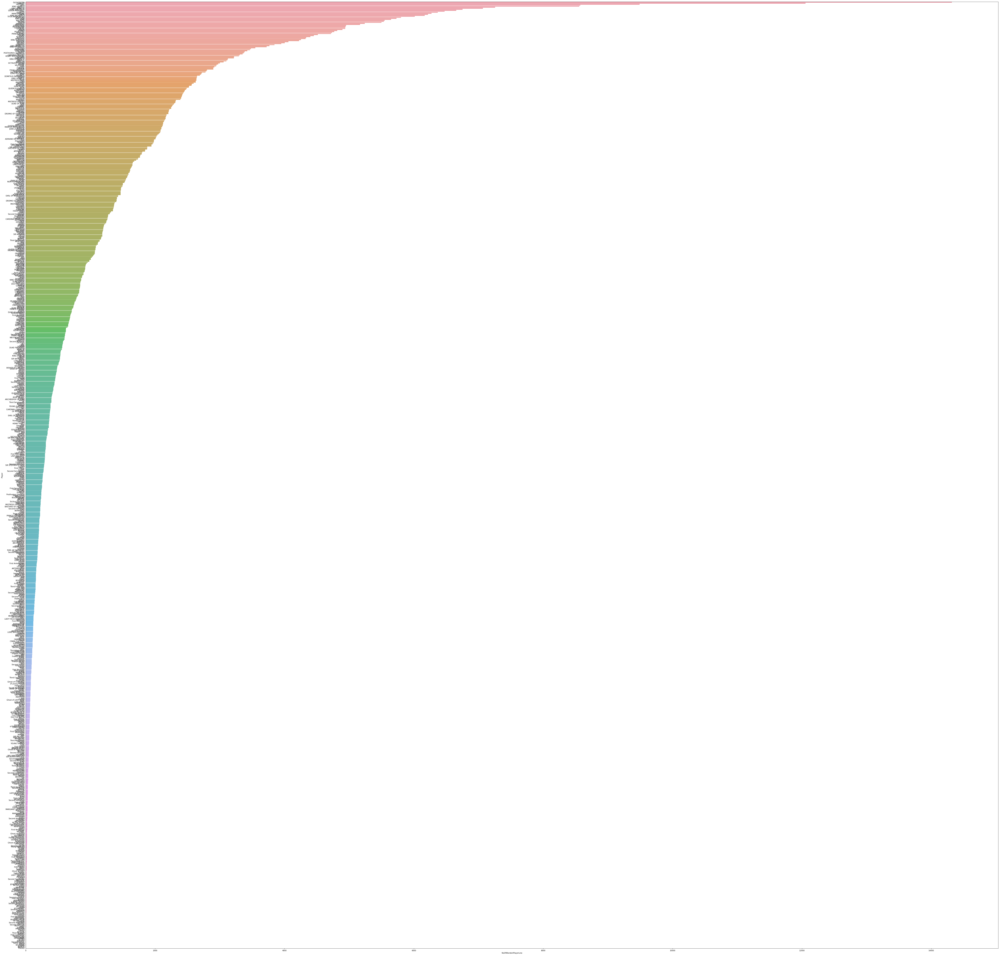

In [75]:
plt.figure(figsize=(100,100))
ax= sns.barplot(x='NoOfWordsInPlayerLine',y='Player',data=importantPlayer)
ax.set(xlabel='NoOfWordsInPlayerLine', ylabel='Player')
plt.show()


In [76]:
importantPlayer

,NoOfWordsInPlayerLine,Player
0,14319,GLOUCESTER
1,12055,HAMLET
2,9489,FALSTAFF
3,8574,IAGO
4,8557,KING HENRY V
5,7256,BRUTUS
6,7068,KING HENRY VI
7,6752,DUKE VINCENTIO
8,6655,QUEEN MARGARET
9,6476,Clown


In [77]:
importantPlayer.to_csv('Shakespeare_ds_importantPlayer.csv')

In [78]:
df

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,NoOfWordsInPlayerLine
0,1,Henry IV,NaN,NaN,Unknown,ACT I,2
1,2,Henry IV,NaN,NaN,Unknown,SCENE I. London. The palace.,5
2,3,Henry IV,NaN,NaN,Unknown,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ...",16
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,7
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,7
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,8
8,9,Henry IV,1.0,1.1.6,KING HENRY IV,Shall daub her lips with her own children's bl...,9
9,10,Henry IV,1.0,1.1.7,KING HENRY IV,"Nor more shall trenching war channel her fields,",8


In [ ]:
#df_uniqueWords_Count_In_PlayerLine=pd.DataFrame(r1,columns=['PlayerLine'])



In [76]:
df

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,NoOfWordsInPlayerLine
0,1,Henry IV,NaN,NaN,Unknown,ACT I,2
1,2,Henry IV,NaN,NaN,Unknown,SCENE I. London. The palace.,5
2,3,Henry IV,NaN,NaN,Unknown,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ...",16
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,7
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,7
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,8
8,9,Henry IV,1.0,1.1.6,KING HENRY IV,Shall daub her lips with her own children's bl...,9
9,10,Henry IV,1.0,1.1.7,KING HENRY IV,"Nor more shall trenching war channel her fields,",8


In [79]:
from collections import Counter
result = Counter(" ".join(df['PlayerLine'].values.tolist()).split(" ")).items()
result

dict_items([('ACT', 180), ('I', 18949), ('SCENE', 729), ('I.', 257), ('London.', 45), ('The', 3700), ('palace.', 115), ('Enter', 1876), ('KING', 181), ('HENRY,', 13), ('LORD', 15), ('JOHN', 27), ('OF', 101), ('LANCASTER,', 4), ('the', 23285), ('EARL', 8), ('of', 14666), ('WESTMORELAND,', 6), ('SIR', 71), ('WALTER', 7), ('BLUNT,', 4), ('and', 17698), ('others', 116), ('So', 783), ('shaken', 2), ('as', 4095), ('we', 2518), ('are,', 92), ('so', 2862), ('wan', 2), ('with', 6410), ('care,', 32), ('Find', 23), ('a', 12129), ('time', 631), ('for', 5509), ('frighted', 11), ('peace', 139), ('to', 15011), ('pant,', 1), ('And', 6547), ('breathe', 43), ('short-winded', 1), ('accents', 5), ('new', 148), ('broils', 5), ('To', 3118), ('be', 5834), ('commenced', 2), ('in', 9199), ('strands', 1), ('afar', 19), ('remote.', 1), ('No', 372), ('more', 1564), ('thirsty', 6), ('entrance', 12), ('this', 4713), ('soil', 12), ('Shall', 390), ('daub', 3), ('her', 2830), ('lips', 65), ('own', 607), ("children's",

In [79]:
from collections import Counter
result = Counter(" ".join(df['PlayerLine'].values.tolist()).lower().split(" ")).items()
result

dict_items([('act', 249), ('i', 18949), ('scene', 755), ('i.', 257), ('london.', 45), ('the', 26991), ('palace.', 116), ('enter', 1953), ('king', 888), ('henry,', 54), ('lord', 782), ('john', 122), ('of', 15697), ('lancaster,', 29), ('earl', 82), ('westmoreland,', 14), ('sir', 439), ('walter', 17), ('blunt,', 19), ('and', 24245), ('others', 118), ('so', 3645), ('shaken', 3), ('as', 5441), ('we', 3172), ('are,', 93), ('wan', 2), ('with', 7342), ('care,', 32), ('find', 474), ('a', 13907), ('time', 664), ('for', 7034), ('frighted', 12), ('peace', 162), ('to', 18129), ('pant,', 1), ('breathe', 48), ('short-winded', 1), ('accents', 5), ('new', 158), ('broils', 5), ('be', 6260), ('commenced', 2), ('in', 10212), ('strands', 1), ('afar', 19), ('remote.', 1), ('no', 2753), ('more', 1763), ('thirsty', 6), ('entrance', 13), ('this', 5704), ('soil', 13), ('shall', 3351), ('daub', 3), ('her', 3001), ('lips', 65), ('own', 607), ("children's", 12), ('blood,', 170), ('nor', 914), ('trenching', 1), ('w

In [80]:
most_Common_Word_df = pd.DataFrame([result])

In [81]:
most_Common_Word_df

,0,1,2,3,4,5,6,7,8,9,...,60713,60714,60715,60716,60717,60718,60719,60720,60721,60722
0,"(ACT, 180)","(I, 18949)","(SCENE, 729)","(I., 257)","(London., 45)","(The, 3700)","(palace., 115)","(Enter, 1876)","(KING, 181)","(HENRY,, 13)",...,"(relation., 1)","(winners, 1)","(exultation, 1)","(Partake, 1)","(question'd,, 1)","(far--, 1)","(mind--to, 1)","(directing,, 1)","(leisurely, 1)","(dissever'd:, 1)"


In [82]:
most_Common_Word_df.to_csv('Shakespeare_ds_Most_common_word.csv')

In [105]:
from pandas import ExcelWriter

writer = ExcelWriter('Shakespeare_ds_Most_common_word.xlsx')
most_Common_Word_df.to_excel(writer,'Sheet5')
writer.save()

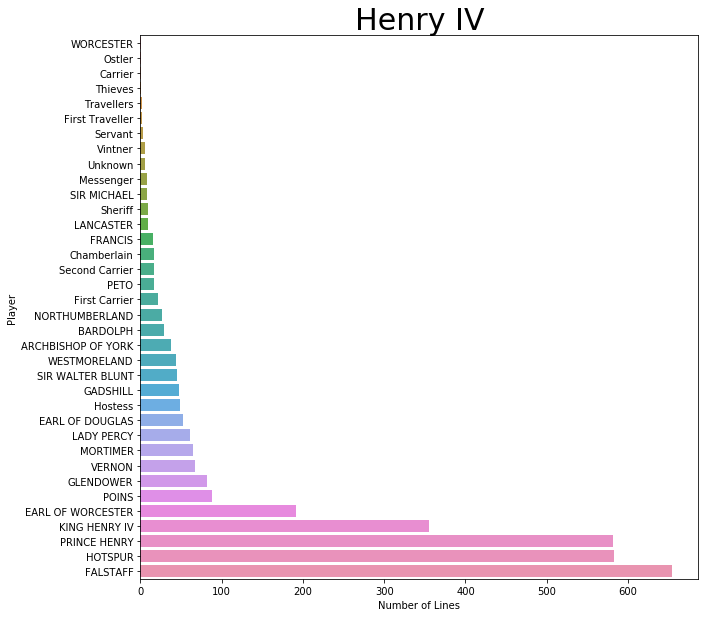

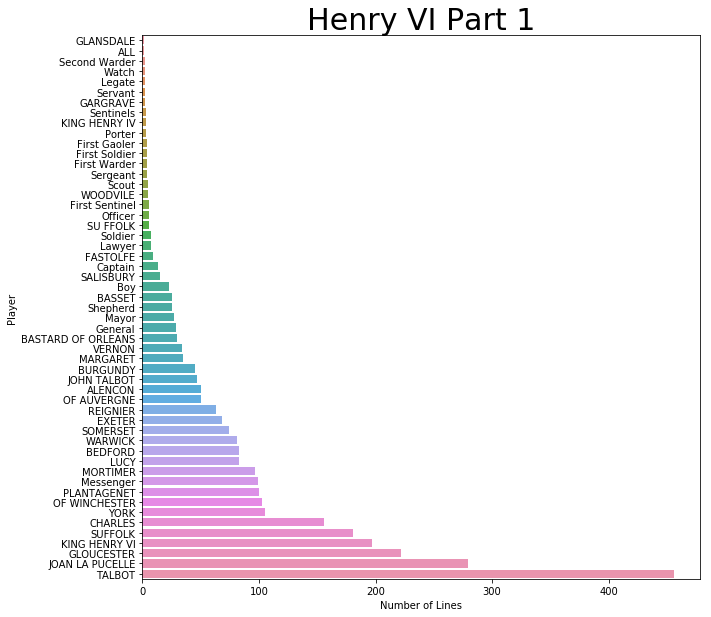

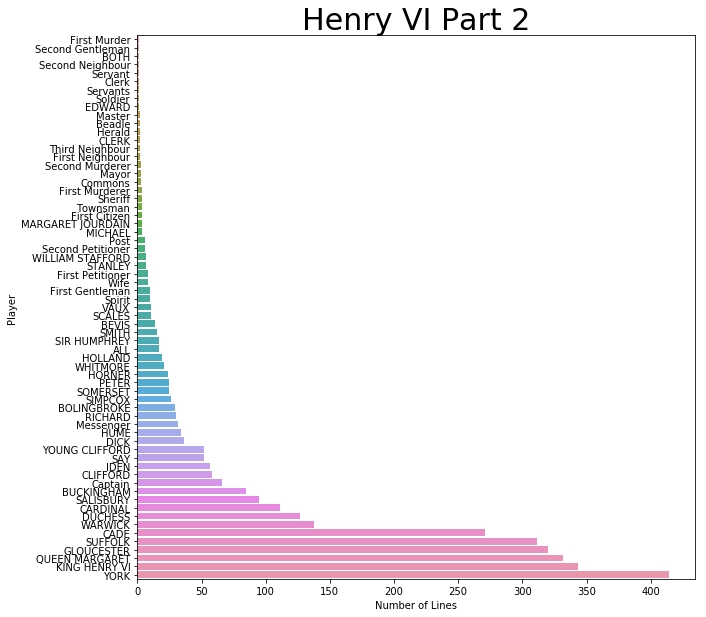

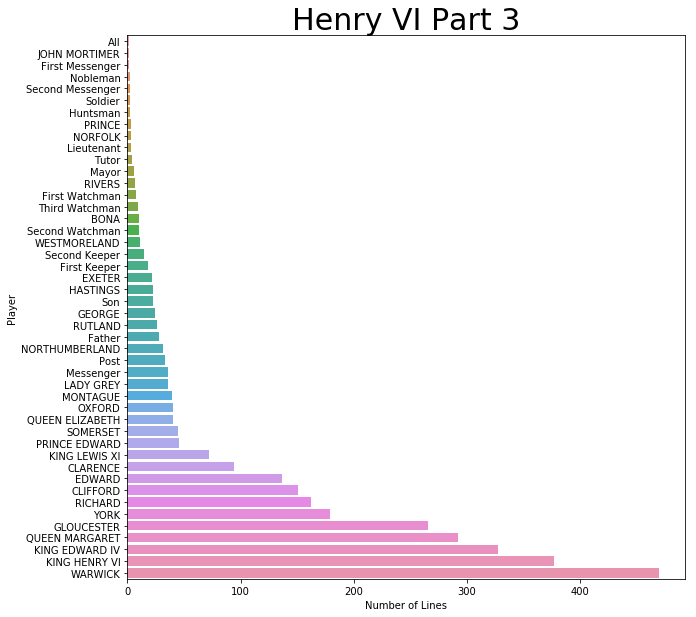

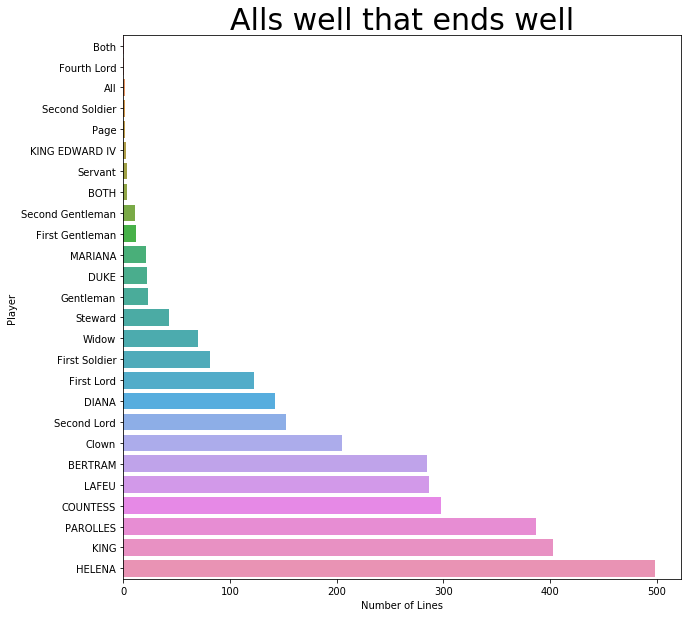

...

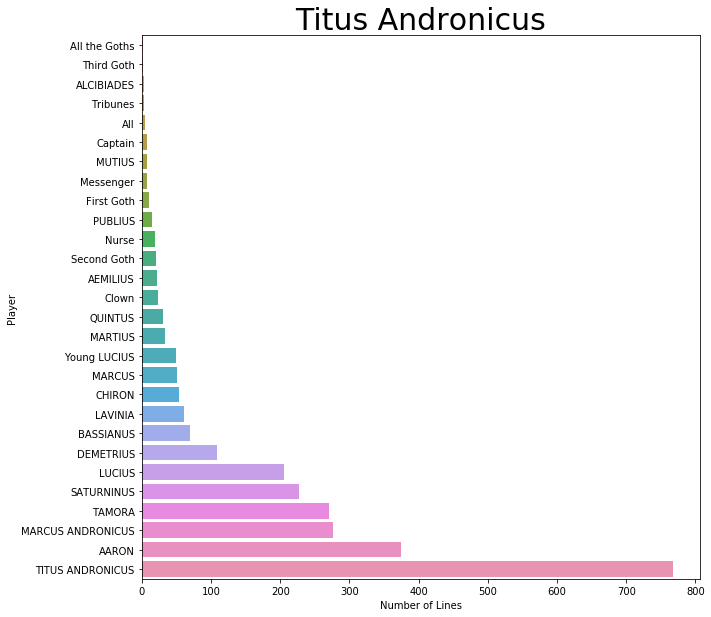

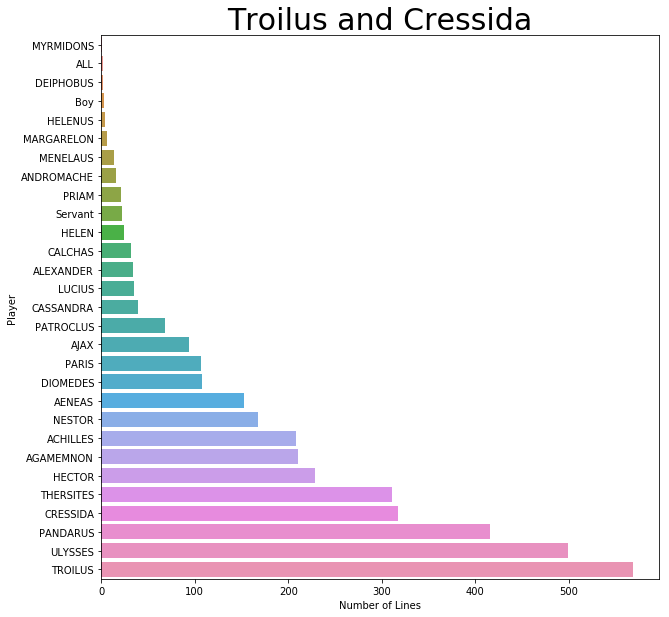

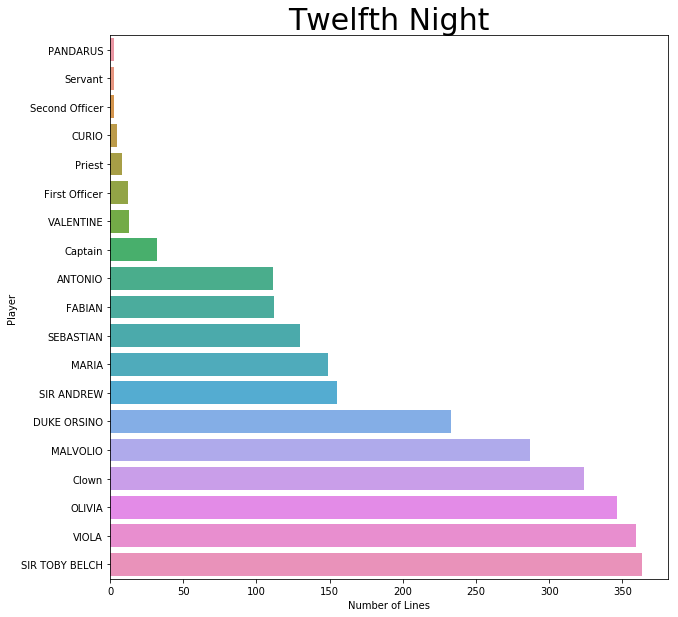

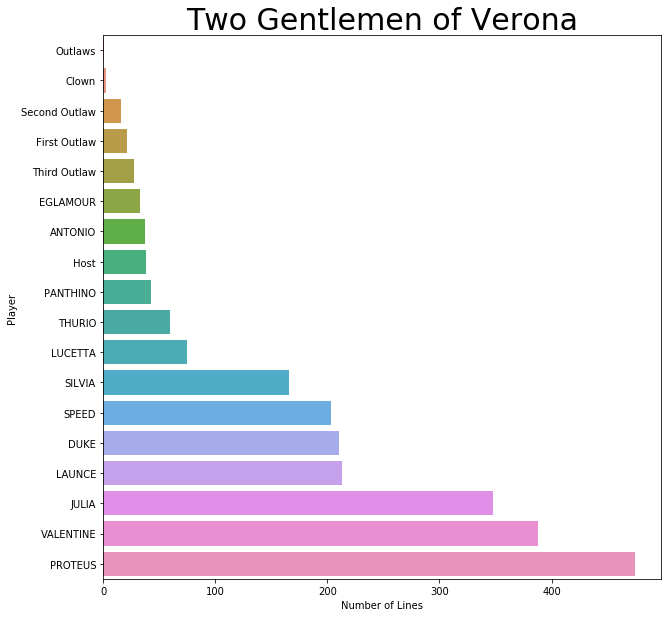

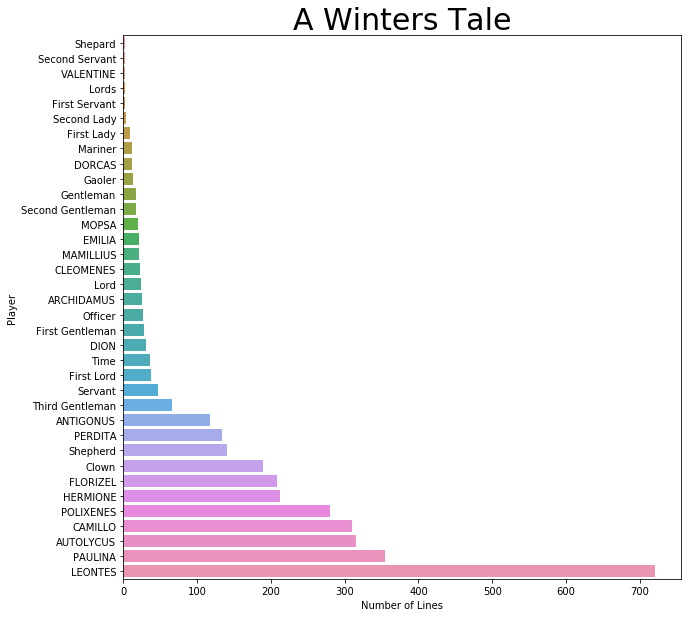

In [83]:
play_name = df['Play'].unique().tolist()
for play in play_name:
    p_line = df[df['Play']==play].groupby('Player').count().sort_values(by='PlayerLine',ascending=True)['PlayerLine']
    p_line = p_line.to_frame()
    p_line['Player'] = p_line.index.tolist()
    p_line.index = np.arange(0,len(p_line))
    p_line.columns=['Lines','Player']
    plt.figure(figsize=(10,10))
    ax= sns.barplot(x='Lines',y='Player',data=p_line)
    ax.set(xlabel='Number of Lines', ylabel='Player')
    plt.title(play,fontsize=30)
    plt.show()

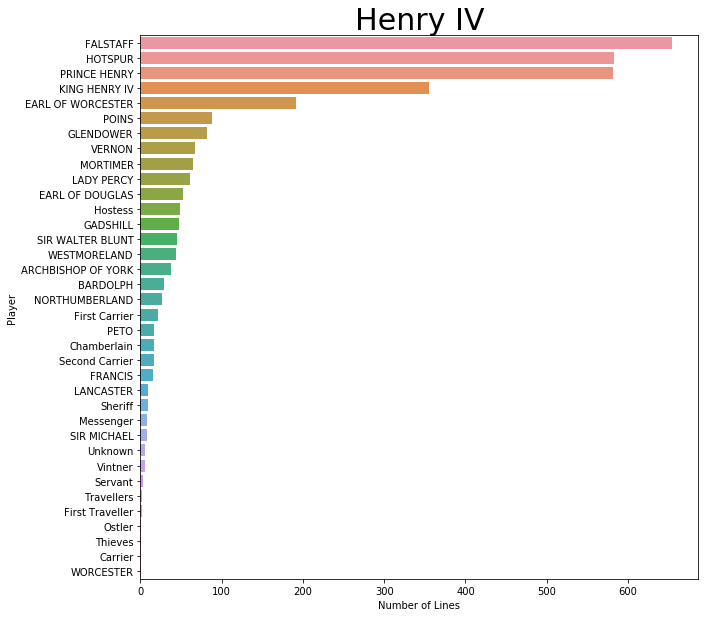

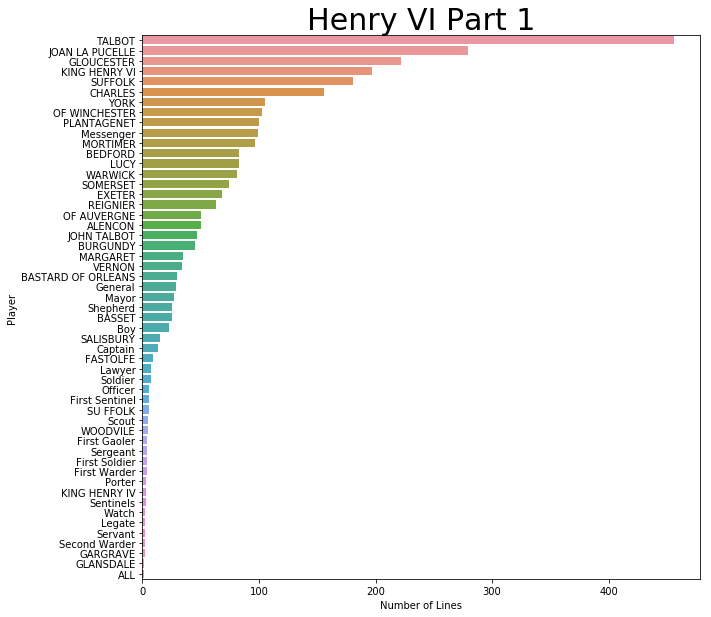

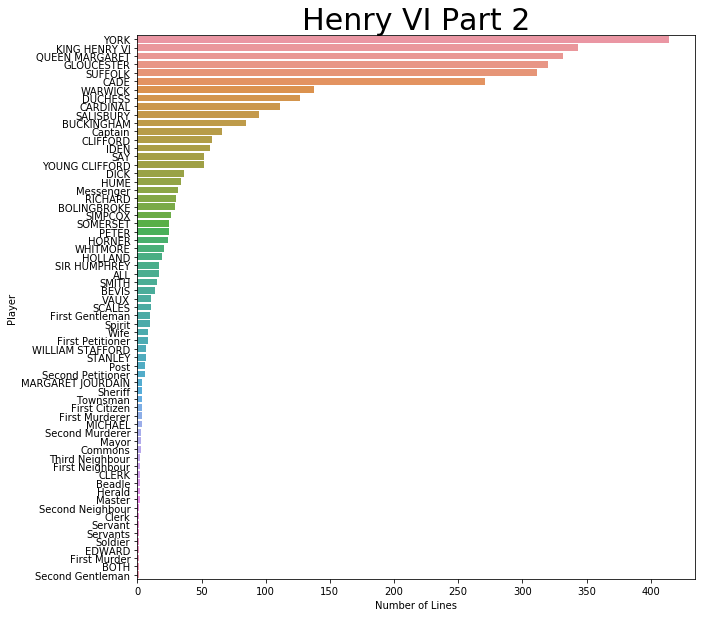

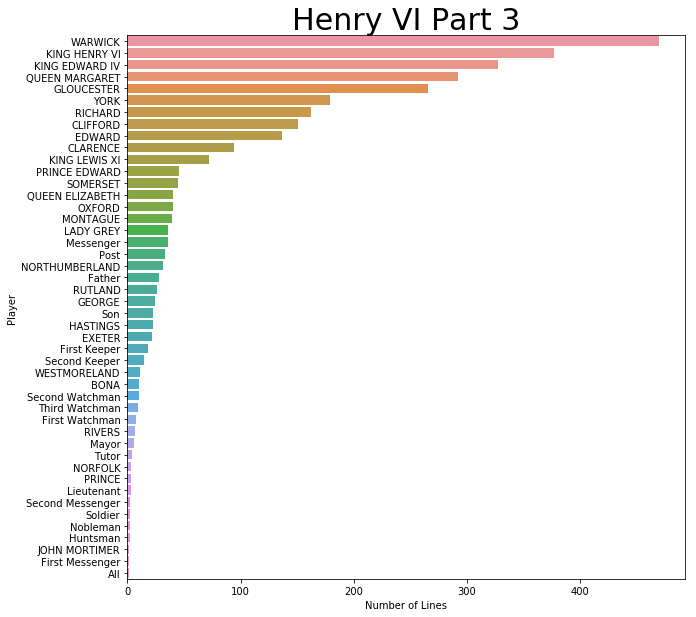

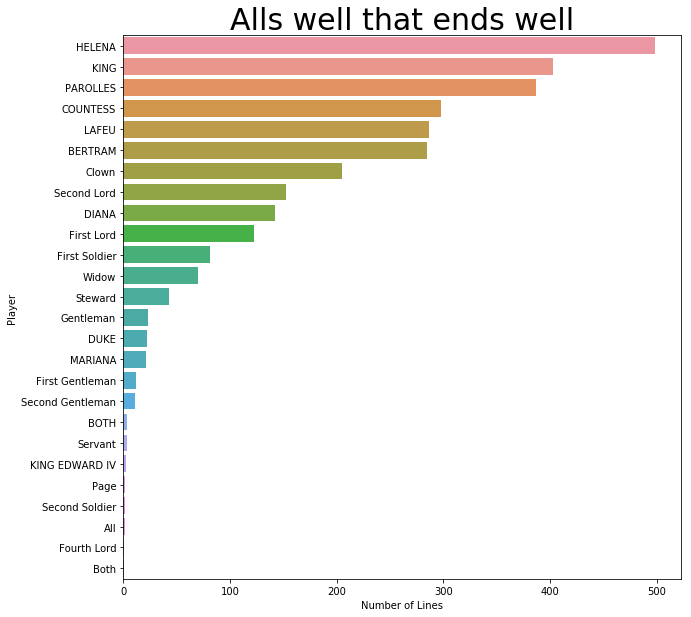

...

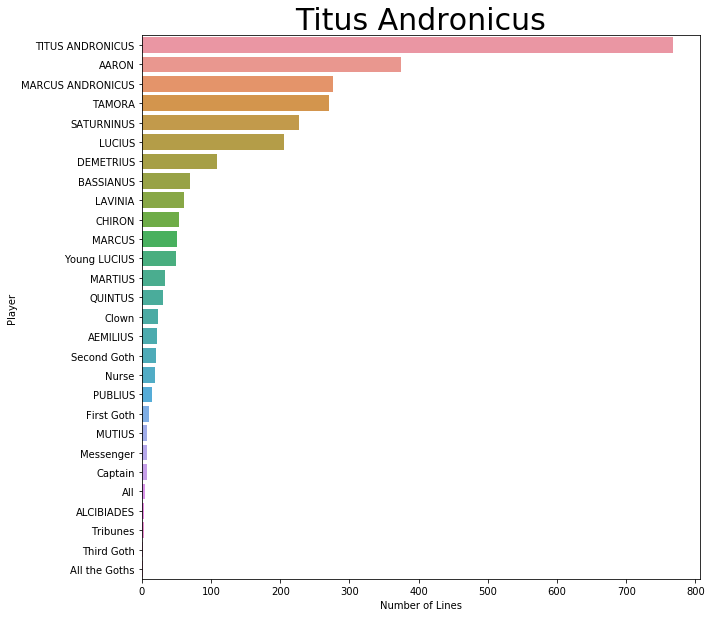

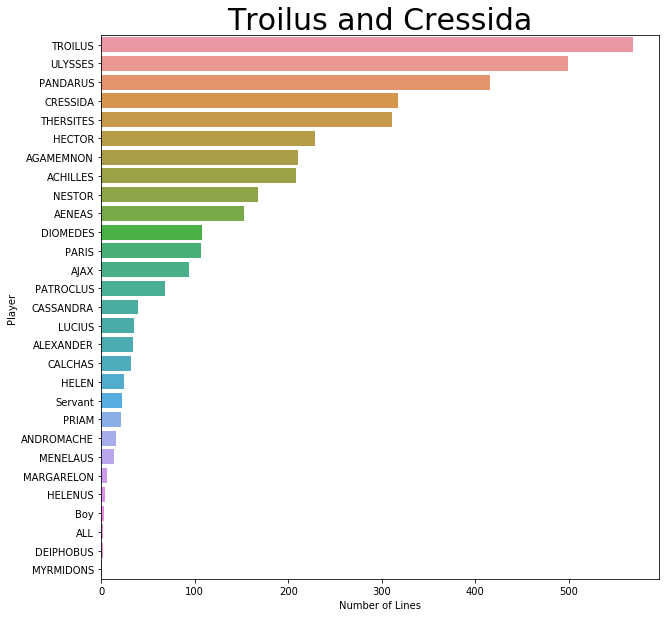

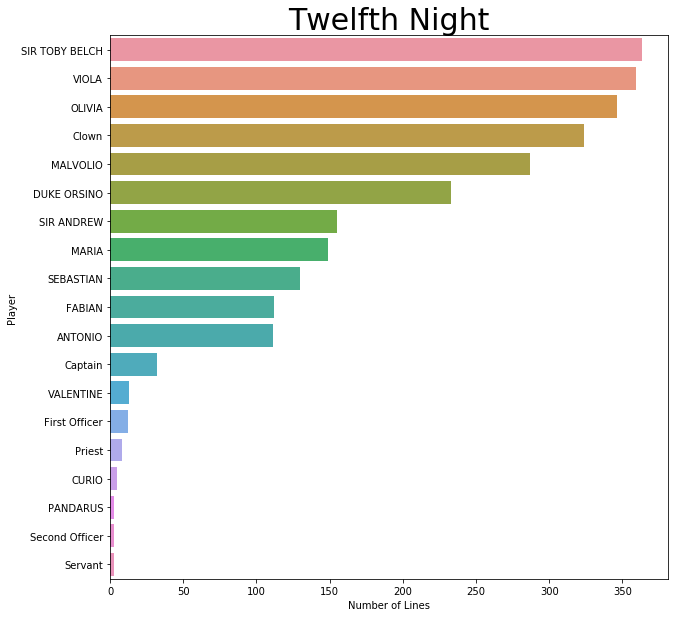

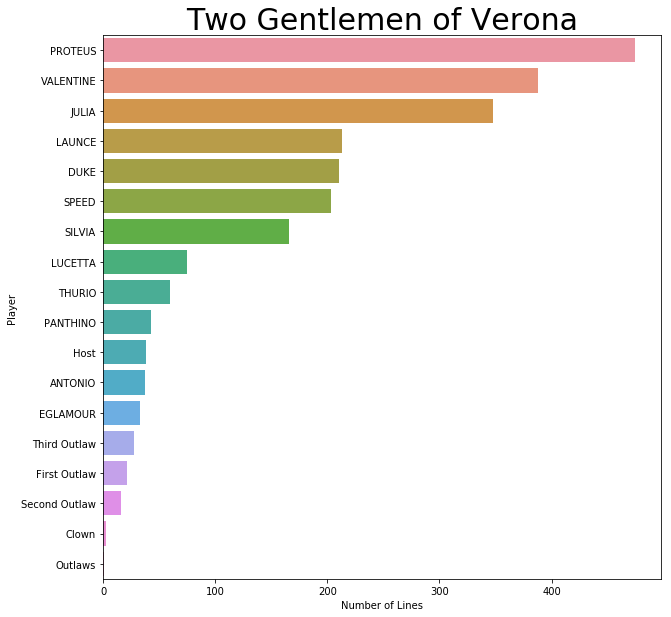

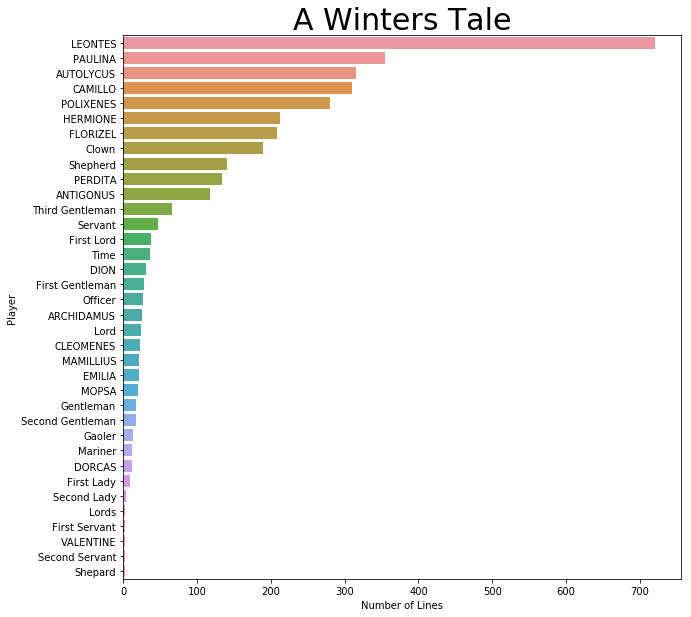

In [110]:
play_name = df['Play'].unique().tolist()
for play in play_name:
    p_line = df[df['Play']==play].groupby('Player').count().sort_values(by='PlayerLine',ascending=False)['PlayerLine']
    p_line = p_line.to_frame()
    p_line['Player'] = p_line.index.tolist()
    p_line.index = np.arange(0,len(p_line))
    p_line.columns=['Lines','Player']
    plt.figure(figsize=(10,10))
    ax= sns.barplot(x='Lines',y='Player',data=p_line)
    ax.set(xlabel='Number of Lines', ylabel='Player')
    plt.title(play,fontsize=30)
    plt.show()

In [114]:
g= nx.Graph()

In [116]:
df

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,NoOfWordsInPlayerLine
0,1,Henry IV,NaN,NaN,Unknown,ACT I,2
1,2,Henry IV,NaN,NaN,Unknown,SCENE I. London. The palace.,5
2,3,Henry IV,NaN,NaN,Unknown,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ...",16
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,7
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,7
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,8
8,9,Henry IV,1.0,1.1.6,KING HENRY IV,Shall daub her lips with her own children's bl...,9
9,10,Henry IV,1.0,1.1.7,KING HENRY IV,"Nor more shall trenching war channel her fields,",8


In [134]:
trainingDS=df.sample(frac=0.8,random_state=200)
testingDS=df.drop(train.index)

In [135]:

trainingDS

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,NoOfWordsInPlayerLine
53329,53330,Loves Labours Lost,1.0,2.1.5,BOYET,To parley with the sole inheritor,6
16126,16127,As you like it,95.0,1.2.205,DUKE FREDERICK,I would thou hadst told me of another father.,9
55758,55759,Loves Labours Lost,404.0,5.2.952,ADRIANO DE ARMADO,WINTER.,1
65989,65990,Merry Wives of Windsor,30.0,3.5.62,FALSTAFF,"'larum of jealousy, comes me in the instant of...",10
75937,75938,Pericles,14.0,NaN,ANTIOCHUS,Exeunt all but PERICLES,4
56644,56645,macbeth,29.0,NaN,MACDUFF,Enter LADY MACBETH,3
91683,91684,The Tempest,40.0,1.2.199,PROSPERO,"Sit still, and hear the last of our sea-sorrow.",9
18218,18219,As you like it,16.0,5.2.59,ROSALIND,"magician, most profound in his art and yet not",9
73693,73694,Othello,21.0,3.3.55,DESDEMONA,"I prithee, call him back.",5
15236,15237,Alls well that ends well,38.0,4.5.96,Clown,and nod at every man.,5


In [84]:
testingDS.describe()

NameError: name 'testingDS' is not defined

In [138]:
testingDS.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22279 entries, 3 to 111392
Data columns (total 7 columns):
Dataline                 22279 non-null int64
Play                     22279 non-null object
PlayerLinenumber         22279 non-null float64
ActSceneLine             21015 non-null object
Player                   22279 non-null object
PlayerLine               22279 non-null object
NoOfWordsInPlayerLine    22279 non-null int64
dtypes: float64(1), int64(2), object(4)
memory usage: 1.4+ MB


In [ ]:
testingDS.info()

In [140]:
from sklearn.model_selection import train_test_split
trainingSet, testSet = train_test_split(df, test_size=0.2)

In [142]:
trainingSet.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89116 entries, 84197 to 11327
Data columns (total 7 columns):
Dataline                 89116 non-null int64
Play                     89116 non-null object
PlayerLinenumber         89114 non-null float64
ActSceneLine             84117 non-null object
Player                   89116 non-null object
PlayerLine               89116 non-null object
NoOfWordsInPlayerLine    89116 non-null int64
dtypes: float64(1), int64(2), object(4)
memory usage: 5.4+ MB


In [ ]:
testSet.info()

GLOUCESTER          1530
HAMLET              1244
IAGO                 917
FALSTAFF             885
KING HENRY V         884
BRUTUS               846
KING HENRY VI        747
OTHELLO              742
MARK ANTONY          737
DUKE VINCENTIO       723
TIMON                689
KING LEAR            662
Clown                662
QUEEN MARGARET       650
MACBETH              646
KING RICHARD II      626
YORK                 598
PROSPERO             596
TITUS ANDRONICUS     592
HELENA               582
CLEOPATRA            581
LEONTES              576
CORIOLANUS           570
PORTIA               565
ROSALIND             559
WARWICK              545
BUCKINGHAM           528
PERICLES             528
ROMEO                525
BIRON                515
                    ... 
A Lord                 1
Thieves                1
POMPHEY                1
Haberdasher            1
GURNEY                 1
MYRMIDONS              1
First Commoner         1
Mariners               1
All the Goths          1


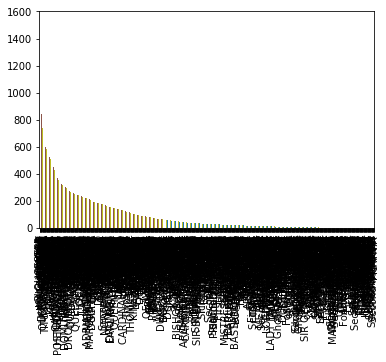

In [144]:
trainingSet["Player"].value_counts().plot(kind="bar")
trainingSet["Player"].value_counts()

In [221]:

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(df.PlayerLinenumber, df.Play, test_size=0.25, random_state=0)

In [218]:

from sklearn.linear_model import LogisticRegression

In [219]:
logisticRegr = LogisticRegression()

In [223]:
logisticRegr.fit(x_train), y_train)

AttributeError: 'Series' object has no attribute 'reshape'

In [96]:
df

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,NoOfWordsInPlayerLine
0,1,Henry IV,NaN,NaN,Unknown,ACT I,2
1,2,Henry IV,NaN,NaN,Unknown,SCENE I. London. The palace.,5
2,3,Henry IV,NaN,NaN,Unknown,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ...",16
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,7
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,7
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,8
8,9,Henry IV,1.0,1.1.6,KING HENRY IV,Shall daub her lips with her own children's bl...,9
9,10,Henry IV,1.0,1.1.7,KING HENRY IV,"Nor more shall trenching war channel her fields,",8


In [131]:
df.drop('ActSceneLine', axis=1, inplace=True)

In [132]:
df

,Dataline,Play,PlayerLinenumber,Player
0,1,Henry IV,NaN,Unknown
1,2,Henry IV,NaN,Unknown
2,3,Henry IV,NaN,Unknown
3,4,Henry IV,1.0,KING HENRY IV
4,5,Henry IV,1.0,KING HENRY IV
5,6,Henry IV,1.0,KING HENRY IV
6,7,Henry IV,1.0,KING HENRY IV
7,8,Henry IV,1.0,KING HENRY IV
8,9,Henry IV,1.0,KING HENRY IV
9,10,Henry IV,1.0,KING HENRY IV


In [111]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(df.Player, df.Play, test_size=0.25, random_state=0)

In [157]:
X = df.loc[:, df.columns != 'Player']
y = df.loc[:, df.columns == 'Play']

In [158]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

ValueError: could not convert string to float: '1.2.115'

In [141]:
X

,Dataline,Play,PlayerLinenumber
0,1,Henry IV,NaN
1,2,Henry IV,NaN
2,3,Henry IV,NaN
3,4,Henry IV,1.0
4,5,Henry IV,1.0
5,6,Henry IV,1.0
6,7,Henry IV,1.0
7,8,Henry IV,1.0
8,9,Henry IV,1.0
9,10,Henry IV,1.0


In [136]:
y

,Player
0,Unknown
1,Unknown
2,Unknown
3,KING HENRY IV
4,KING HENRY IV
5,KING HENRY IV
6,KING HENRY IV
7,KING HENRY IV
8,KING HENRY IV
9,KING HENRY IV


In [142]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
import matplotlib.pyplot as plt 
plt.rc("font", size=14)
from sklearn.linear_model import LogisticRegression
from sklearn.cross_validation import train_test_split
import seaborn as sns
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)

C:\Users\p860n111\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [159]:
df=pd.read_csv('C:\\Users\\p860n111\\Desktop\\data science\\Hw2\\Shakespeare_data.csv')

In [160]:
df = df.dropna()
print(df.shape)
print(list(df.columns))

(105152, 6)
['Dataline', 'Play', 'PlayerLinenumber', 'ActSceneLine', 'Player', 'PlayerLine']


In [154]:
X = df.iloc[:,1:]
y = df.iloc[:,0]
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [155]:
classifier = LogisticRegression(random_state=0)
classifier.fit(X_train, y_train)

ValueError: could not convert string to float: 'BRABANTIO'

In [152]:
df.drop('PlayerLine', axis=1, inplace=True)

In [156]:
df

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player
3,4,Henry IV,1.0,1.1.1,KING HENRY IV
4,5,Henry IV,1.0,1.1.2,KING HENRY IV
5,6,Henry IV,1.0,1.1.3,KING HENRY IV
6,7,Henry IV,1.0,1.1.4,KING HENRY IV
7,8,Henry IV,1.0,1.1.5,KING HENRY IV
8,9,Henry IV,1.0,1.1.6,KING HENRY IV
9,10,Henry IV,1.0,1.1.7,KING HENRY IV
10,11,Henry IV,1.0,1.1.8,KING HENRY IV
11,12,Henry IV,1.0,1.1.9,KING HENRY IV
12,13,Henry IV,1.0,1.1.10,KING HENRY IV


In [172]:
df = pd.read_csv('C:\\Users\\p860n111\\Desktop\\data science\\Hw2\\Shakespeare_data.csv')

In [173]:
df.head()

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine
0,1,Henry IV,NaN,NaN,NaN,ACT I
1,2,Henry IV,NaN,NaN,NaN,SCENE I. London. The palace.
2,3,Henry IV,NaN,NaN,NaN,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ..."
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,"
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,"


In [174]:
df = df.dropna()
print(df.shape)
print(list(df.columns))

(105152, 6)
['Dataline', 'Play', 'PlayerLinenumber', 'ActSceneLine', 'Player', 'PlayerLine']


In [164]:
feature_cols = ['Player', 'Play']

In [165]:
# you want all rows, and the feature_cols' columns
X = train.loc[:, feature_cols]

In [168]:
# now we want to create our response vector
y = train.Player

In [169]:
# 1. import
from sklearn.linear_model import LogisticRegression

# 2. instantiate model
logreg = LogisticRegression()

# 3. fit 
logreg.fit(X, y)

ValueError: could not convert string to float: 'A Winters Tale'

In [175]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105152 entries, 3 to 111394
Data columns (total 6 columns):
Dataline            105152 non-null int64
Play                105152 non-null object
PlayerLinenumber    105152 non-null float64
ActSceneLine        105152 non-null object
Player              105152 non-null object
PlayerLine          105152 non-null object
dtypes: float64(1), int64(1), object(4)
memory usage: 5.6+ MB


In [176]:
df.drop('Dataline', axis=1, inplace=True)
df.drop('PlayerLinenumber', axis=1, inplace=True)
df.drop('ActSceneLine', axis=1, inplace=True)
df.drop('Dataline', axis=1, inplace=True)
df.drop('PlayerLine', axis=1, inplace=True)

KeyError: "labels ['Dataline'] not contained in axis"

In [177]:
df.drop('Dataline', axis=1, inplace=True)

KeyError: "labels ['Dataline'] not contained in axis"

In [179]:
df.drop('PlayerLine', axis=1, inplace=True)

In [180]:
df

,Play,Player
3,Henry IV,KING HENRY IV
4,Henry IV,KING HENRY IV
5,Henry IV,KING HENRY IV
6,Henry IV,KING HENRY IV
7,Henry IV,KING HENRY IV
8,Henry IV,KING HENRY IV
9,Henry IV,KING HENRY IV
10,Henry IV,KING HENRY IV
11,Henry IV,KING HENRY IV
12,Henry IV,KING HENRY IV


In [186]:
x =df.ix[:,0].values
y = df.ix[:,1].values

C:\Users\p860n111\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.
C:\Users\p860n111\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  


In [189]:
X_train, X_test, y_train, y_test = train_test_split(xogReg = LogisticRegression()
LogReg.fit(X_train, y_train), y, test_size=0.25, random_state=0)

In [191]:
LogReg = LogisticRegression()
LogReg.fit(X_train, y_train)

ValueError: could not convert string to float: 'Othello'

In [194]:
X_train

array(['Henry VI Part 2', 'Henry VI Part 3', 'Henry VI Part 3', ...,
       'King John', 'King John', 'Othello'], dtype=object)

In [197]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105152 entries, 3 to 111394
Data columns (total 2 columns):
Play      105152 non-null object
Player    105152 non-null object
dtypes: object(2)
memory usage: 2.4+ MB


In [227]:
df = pd.read_csv('C:\\Users\\p860n111\\Desktop\\data science\\Hw2\\Shakespeare_data.csv')

In [228]:
df = df.dropna()
print(df.shape)
print(list(df.columns))

(105152, 6)
['Dataline', 'Play', 'PlayerLinenumber', 'ActSceneLine', 'Player', 'PlayerLine']


In [224]:
# Import train_test_split function
from sklearn.model_selection import train_test_split

X=df[['PlayerLinenumber']]  # Features
y=df['Player']  # Labels

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1) # 70% training and 30% test

In [225]:
#Import Random Forest Model
from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)

In [226]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.05600988969189806


In [229]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105152 entries, 3 to 111394
Data columns (total 6 columns):
Dataline            105152 non-null int64
Play                105152 non-null object
PlayerLinenumber    105152 non-null float64
ActSceneLine        105152 non-null object
Player              105152 non-null object
PlayerLine          105152 non-null object
dtypes: float64(1), int64(1), object(4)
memory usage: 5.6+ MB


In [230]:
df.dtypes

Dataline              int64
Play                 object
PlayerLinenumber    float64
ActSceneLine         object
Player               object
PlayerLine           object
dtype: object

In [231]:
obj_df = df.select_dtypes(include=['object']).copy()
obj_df.head()

,Play,ActSceneLine,Player,PlayerLine
3,Henry IV,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,"
4,Henry IV,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,"
5,Henry IV,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils
6,Henry IV,1.1.4,KING HENRY IV,To be commenced in strands afar remote.
7,Henry IV,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil


In [232]:
df["Play"] = df["Play"].astype('category')
df.dtypes

Dataline               int64
Play                category
PlayerLinenumber     float64
ActSceneLine          object
Player                object
PlayerLine            object
dtype: object

In [233]:
df["Play_cat"] = df["Play"].cat.codes
df.head()

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,Play_cat
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,9
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,9
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,9


In [237]:
df.dtypes

Dataline                   int64
Play                    category
PlayerLinenumber        category
ActSceneLine              object
Player                    object
PlayerLine                object
Play_cat                    int8
PlayerLinenumber_cat       int16
dtype: object

In [236]:
df["PlayerLinenumber"] = df["PlayerLinenumber"].astype('category')
df.dtypes
df["PlayerLinenumber_cat"] = df["PlayerLinenumber"].cat.codes
df.head()

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,Play_cat,PlayerLinenumber_cat
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9,0
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9,0
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,9,0
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,9,0
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,9,0


In [238]:
df["ActSceneLine"] = df["ActSceneLine"].astype('category')
df.dtypes
df["ActSceneLine_cat"] = df["ActSceneLine"].cat.codes
df.head()

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,Play_cat,PlayerLinenumber_cat,ActSceneLine_cat
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9,0,324
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9,0,435
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,9,0,546
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,9,0,657
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,9,0,768


In [241]:
df.dtypes

Dataline                   int64
Play                    category
PlayerLinenumber        category
ActSceneLine            category
Player                  category
PlayerLine                object
Play_cat                    int8
PlayerLinenumber_cat       int16
ActSceneLine_cat           int16
Player_cat                 int16
dtype: object

In [240]:
df["Player"] = df["Player"].astype('category')
df.dtypes
df["Player_cat"] = df["Player"].cat.codes
df.head()

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,Play_cat,PlayerLinenumber_cat,ActSceneLine_cat,Player_cat
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9,0,324,457
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9,0,435,457
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,9,0,546,457
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,9,0,657,457
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,9,0,768,457


In [242]:
df["PlayerLine"] = df["PlayerLine"].astype('category')
df.dtypes
df["PlayerLine_cat"] = df["PlayerLine"].cat.codes
df.head()

,Dataline,Play,PlayerLinenumber,ActSceneLine,Player,PlayerLine,Play_cat,PlayerLinenumber_cat,ActSceneLine_cat,Player_cat,PlayerLine_cat
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,",9,0,324,457,60240
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,",9,0,435,457,23568
5,6,Henry IV,1.0,1.1.3,KING HENRY IV,And breathe short-winded accents of new broils,9,0,546,457,4998
6,7,Henry IV,1.0,1.1.4,KING HENRY IV,To be commenced in strands afar remote.,9,0,657,457,73793
7,8,Henry IV,1.0,1.1.5,KING HENRY IV,No more the thirsty entrance of this soil,9,0,768,457,48893


In [243]:
df.dtypes

Dataline                   int64
Play                    category
PlayerLinenumber        category
ActSceneLine            category
Player                  category
PlayerLine              category
Play_cat                    int8
PlayerLinenumber_cat       int16
ActSceneLine_cat           int16
Player_cat                 int16
PlayerLine_cat             int32
dtype: object

In [245]:
newDF = df.filter(['Dataline','Play_cat','PlayerLinenumber_cat','ActSceneLine_cat','Player_cat','PlayerLine_cat' ], axis=1)

In [248]:
newDF.dtypes

Dataline                int64
Play_cat                 int8
PlayerLinenumber_cat    int16
ActSceneLine_cat        int16
Player_cat              int16
PlayerLine_cat          int32
dtype: object

In [249]:
X = newDF.ix[:,(0,1,2,3,5)].values
y = newDF.ix[:,4].values

C:\Users\p860n111\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.
C:\Users\p860n111\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  


In [250]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .3, random_state=25)

In [251]:
LogReg = LogisticRegression()
LogReg.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [253]:
predictions = LogReg.predict(X_test)

In [254]:
LogReg.predict(X_test[0:10])

array([395, 466, 361, 361, 361, 466, 466, 361, 846,  53], dtype=int16)

In [255]:
predictions = LogReg.predict(X_test)

In [256]:
# Use score method to get accuracy of model
score = LogReg.score(X_test,  y_test)
print(score)

0.05705953211183668


In [257]:
newDF.dtypes

Dataline                int64
Play_cat                 int8
PlayerLinenumber_cat    int16
ActSceneLine_cat        int16
Player_cat              int16
PlayerLine_cat          int32
dtype: object

In [263]:
X1 = newDF.ix[:,(1,2)].values
y1 = newDF.ix[:,4].values

C:\Users\p860n111\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.
C:\Users\p860n111\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  


In [268]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size = .2, random_state=25)

In [ ]:
LogReg = LogisticRegression()
LogReg.fit(X_train1, y_train1)

In [266]:
predictions = LogReg.predict(X_test1)

In [267]:
# Use score method to get accuracy of model
score = LogReg.score(X_test1,  y_test1)
print(score)

0.06067330247891967
